In [143]:
import numpy as np
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
import pickle
import seaborn as sns
import networkx as nx
import matplotlib.pyplot as plt
import os
import statistics as stat

### Levanto las matrices de proximidad ya creadas

### <span style="color:steelblue">Dataset 1: </span>: todos los períodos - 109 países

In [144]:
list_years1 = ['1719', '0709', '9799']
# leo el diccionario ya creado
dic_prox_matrix1 = pickle.load(open("../data/processed/proximity_matrix1.pkl", "rb"))
dic_prox_matrix1

{'1719': product_j      101       102       103       104       105       106   \
 product_i                                                               
 101        1.000000  0.250000  0.277778  0.142857  0.266667  0.228571   
 102        0.250000  1.000000  0.416667  0.361111  0.444444  0.388889   
 103        0.277778  0.416667  1.000000  0.190476  0.300000  0.285714   
 104        0.142857  0.361111  0.190476  1.000000  0.433333  0.285714   
 105        0.266667  0.444444  0.300000  0.433333  1.000000  0.485714   
 ...             ...       ...       ...       ...       ...       ...   
 9702       0.294118  0.027778  0.055556  0.000000  0.066667  0.057143   
 9703       0.235294  0.083333  0.000000  0.095238  0.166667  0.142857   
 9704       0.470588  0.166667  0.222222  0.047619  0.133333  0.085714   
 9705       0.352941  0.111111  0.055556  0.142857  0.300000  0.171429   
 9706       0.235294  0.083333  0.055556  0.142857  0.166667  0.114286   
 
 product_j      201       20

In [145]:
dic_prox_matrix1['1719']

product_j,101,102,103,104,105,106,201,202,203,204,...,9615,9616,9617,9618,9701,9702,9703,9704,9705,9706
product_i,,,,,,,,,,,,,,,,,,,,,
101,1.000000,0.250000,0.277778,0.142857,0.266667,0.228571,0.454545,0.352941,0.294118,0.352941,...,0.058824,0.058824,0.000000,0.294118,0.294118,0.294118,0.235294,0.470588,0.352941,0.235294
102,0.250000,1.000000,0.416667,0.361111,0.444444,0.388889,0.444444,0.194444,0.222222,0.250000,...,0.027778,0.083333,0.027778,0.166667,0.055556,0.027778,0.083333,0.166667,0.111111,0.083333
103,0.277778,0.416667,1.000000,0.190476,0.300000,0.285714,0.409091,0.055556,0.388889,0.166667,...,0.000000,0.111111,0.055556,0.222222,0.000000,0.055556,0.000000,0.222222,0.055556,0.055556
104,0.142857,0.361111,0.190476,1.000000,0.433333,0.285714,0.181818,0.095238,0.095238,0.238095,...,0.000000,0.095238,0.000000,0.142857,0.047619,0.000000,0.095238,0.047619,0.142857,0.142857
105,0.266667,0.444444,0.300000,0.433333,1.000000,0.485714,0.366667,0.166667,0.333333,0.166667,...,0.033333,0.100000,0.033333,0.266667,0.100000,0.066667,0.166667,0.133333,0.300000,0.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9702,0.294118,0.027778,0.055556,0.000000,0.066667,0.057143,0.045455,0.066667,0.076923,0.066667,...,0.142857,0.000000,0.000000,0.125000,0.500000,1.000000,0.384615,0.285714,0.333333,0.363636
9703,0.235294,0.083333,0.000000,0.095238,0.166667,0.142857,0.136364,0.200000,0.153846,0.066667,...,0.000000,0.153846,0.000000,0.187500,0.461538,0.384615,1.000000,0.214286,0.384615,0.538462
9704,0.470588,0.166667,0.222222,0.047619,0.133333,0.085714,0.227273,0.200000,0.214286,0.333333,...,0.000000,0.000000,0.000000,0.187500,0.142857,0.285714,0.214286,1.000000,0.357143,0.142857


In [146]:
dic_prox_matrix1['1719'].index

Int64Index([ 101,  102,  103,  104,  105,  106,  201,  202,  203,  204,
            ...
            9615, 9616, 9617, 9618, 9701, 9702, 9703, 9704, 9705, 9706],
           dtype='int64', name='product_i', length=1241)

In [147]:
# levanto dataset de nomenclaturas en HS_code 4 dígitos
clasif = pd.read_csv('../data/raw/Nomenclaturas/HS1996Description.csv', encoding= 'unicode_escape')
clasif = clasif.rename(columns={'HS 1996 Product Code': 'HS_code', 'HS 1996 Product Description': 'HS_description'})

In [148]:
clasif

,HS_code,HS_description
0,101,"Live horses, asses, mules and hinnies."
1,102,Live bovine animals.
2,103,Live swine.
3,104,Live sheep and goats.
4,105,"Live poultry, that is to say, fowls of the spe..."
...,...,...
1313,9893,UN Special Code
1314,9894,UN Special Code
1315,9895,UN Special Code
1316,9896,UN Special Code


In [189]:
# traigo el listado de productos pertenecientes a la bioeconomía en HS 4 digitos
# el armado de esta lista se encuentra en el notebook de Correspondencias de Productos
df_bioecon = pd.read_csv('../data/processed/list_bioecon_HS4dig.csv')
df_bioecon

,lista_prodbio,Category
0,4101,2
1,4102,2
2,4103,2
3,4104,6
4,4105,6
...,...,...
588,2818,5
589,5105,2
590,3215,5
591,3306,5


In [190]:
df_bioecon.lista_prodbio

0      4101
1      4102
2      4103
3      4104
4      4105
       ... 
588    2818
589    5105
590    3215
591    3306
592    3823
Name: lista_prodbio, Length: 593, dtype: int64

In [174]:
# pruebo para un ejemplo y luego lo escalo para las demás matrices (de los restantes periodos)
# uno matrices de productos con la descripción
merged_df1 = pd.merge(dic_prox_matrix1['1719'], clasif, how='left', left_on=['product_i'], right_on=['HS_code']).set_index(dic_prox_matrix1['1719'].index)

In [175]:
merged_df1

,101,102,103,104,105,106,201,202,203,204,...,9617,9618,9701,9702,9703,9704,9705,9706,HS_code,HS_description
product_i,,,,,,,,,,,,,,,,,,,,,
101,1.000000,0.250000,0.277778,0.142857,0.266667,0.228571,0.454545,0.352941,0.294118,0.352941,...,0.000000,0.294118,0.294118,0.294118,0.235294,0.470588,0.352941,0.235294,101,"Live horses, asses, mules and hinnies."
102,0.250000,1.000000,0.416667,0.361111,0.444444,0.388889,0.444444,0.194444,0.222222,0.250000,...,0.027778,0.166667,0.055556,0.027778,0.083333,0.166667,0.111111,0.083333,102,Live bovine animals.
103,0.277778,0.416667,1.000000,0.190476,0.300000,0.285714,0.409091,0.055556,0.388889,0.166667,...,0.055556,0.222222,0.000000,0.055556,0.000000,0.222222,0.055556,0.055556,103,Live swine.
104,0.142857,0.361111,0.190476,1.000000,0.433333,0.285714,0.181818,0.095238,0.095238,0.238095,...,0.000000,0.142857,0.047619,0.000000,0.095238,0.047619,0.142857,0.142857,104,Live sheep and goats.
105,0.266667,0.444444,0.300000,0.433333,1.000000,0.485714,0.366667,0.166667,0.333333,0.166667,...,0.033333,0.266667,0.100000,0.066667,0.166667,0.133333,0.300000,0.166667,105,"Live poultry, that is to say, fowls of the spe..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9702,0.294118,0.027778,0.055556,0.000000,0.066667,0.057143,0.045455,0.066667,0.076923,0.066667,...,0.000000,0.125000,0.500000,1.000000,0.384615,0.285714,0.333333,0.363636,9702,"Original engravings, prints and lithographs."
9703,0.235294,0.083333,0.000000,0.095238,0.166667,0.142857,0.136364,0.200000,0.153846,0.066667,...,0.000000,0.187500,0.461538,0.384615,1.000000,0.214286,0.384615,0.538462,9703,"Original sculptures and statuary, in any mater..."
9704,0.470588,0.166667,0.222222,0.047619,0.133333,0.085714,0.227273,0.200000,0.214286,0.333333,...,0.000000,0.187500,0.142857,0.285714,0.214286,1.000000,0.357143,0.142857,9704,"Postage or revenue stamps, stamp-postmarks, fi..."


In [176]:
merged_df1['es_bio_prod'] = np.where(merged_df1['HS_code'].isin(df_bioecon.lista_prodbio), True, False)

In [191]:
merged_df1 = pd.merge(merged_df1, df_bioecon, how='left', left_on=['product_i'], right_on=['lista_prodbio']).set_index(merged_df1.index)
merged_df1

,101,102,103,104,105,106,201,202,203,204,...,9703,9704,9705,9706,HS_code,HS_description,es_bio_prod,paths,lista_prodbio,Category
product_i,,,,,,,,,,,,,,,,,,,,,
101,1.000000,0.250000,0.277778,0.142857,0.266667,0.228571,0.454545,0.352941,0.294118,0.352941,...,0.235294,0.470588,0.352941,0.235294,101,"Live horses, asses, mules and hinnies.",True,186.873676,101.0,0.0
102,0.250000,1.000000,0.416667,0.361111,0.444444,0.388889,0.444444,0.194444,0.222222,0.250000,...,0.083333,0.166667,0.111111,0.083333,102,Live bovine animals.,True,225.533203,102.0,0.0
103,0.277778,0.416667,1.000000,0.190476,0.300000,0.285714,0.409091,0.055556,0.388889,0.166667,...,0.000000,0.222222,0.055556,0.055556,103,Live swine.,True,243.151722,103.0,0.0
104,0.142857,0.361111,0.190476,1.000000,0.433333,0.285714,0.181818,0.095238,0.095238,0.238095,...,0.095238,0.047619,0.142857,0.142857,104,Live sheep and goats.,True,193.912375,104.0,0.0
105,0.266667,0.444444,0.300000,0.433333,1.000000,0.485714,0.366667,0.166667,0.333333,0.166667,...,0.166667,0.133333,0.300000,0.166667,105,"Live poultry, that is to say, fowls of the spe...",True,272.311305,105.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9702,0.294118,0.027778,0.055556,0.000000,0.066667,0.057143,0.045455,0.066667,0.076923,0.066667,...,0.384615,0.285714,0.333333,0.363636,9702,"Original engravings, prints and lithographs.",False,108.799664,NaN,NaN
9703,0.235294,0.083333,0.000000,0.095238,0.166667,0.142857,0.136364,0.200000,0.153846,0.066667,...,1.000000,0.214286,0.384615,0.538462,9703,"Original sculptures and statuary, in any mater...",False,176.287620,NaN,NaN
9704,0.470588,0.166667,0.222222,0.047619,0.133333,0.085714,0.227273,0.200000,0.214286,0.333333,...,0.214286,1.000000,0.357143,0.142857,9704,"Postage or revenue stamps, stamp-postmarks, fi...",False,155.167729,NaN,NaN


In [178]:
merged_df1.loc[503,503] # hay productos que tienen nan en la diagonal y 0 con todos los demas, habría que descartar estos datos

nan

In [179]:
merged_df1.loc[502]

101                                                             0.0
102                                                             0.0
103                                                             0.0
104                                                             0.0
105                                                             0.0
                                        ...                        
9705                                                            0.0
9706                                                            0.0
HS_code                                                         502
HS_description    Pigs', hogs' or boars' bristles and hair; badg...
es_bio_prod                                                    True
Name: 502, Length: 1244, dtype: object

### <span style="color:steelblue">Dataset 2: </span>últimos 2 períodos - 157 países

In [156]:
list_years2 = ['1719', '0709']
# leo el diccionario ya creado
dic_prox_matrix2 = pickle.load(open("../data/processed/proximity_matrix2.pkl", "rb"))
dic_prox_matrix2

{'1719': product_j      101       102       103       104       105       106   \
 product_i                                                               
 101        1.000000  0.232558  0.263158  0.142857  0.270270  0.166667   
 102        0.232558  1.000000  0.348837  0.395349  0.395349  0.333333   
 103        0.263158  0.348837  1.000000  0.142857  0.243243  0.208333   
 104        0.142857  0.395349  0.142857  1.000000  0.351351  0.270833   
 105        0.270270  0.395349  0.243243  0.351351  1.000000  0.416667   
 ...             ...       ...       ...       ...       ...       ...   
 9702       0.263158  0.023256  0.000000  0.035714  0.108108  0.062500   
 9703       0.263158  0.116279  0.000000  0.071429  0.189189  0.125000   
 9704       0.368421  0.116279  0.166667  0.035714  0.162162  0.104167   
 9705       0.368421  0.116279  0.000000  0.142857  0.243243  0.145833   
 9706       0.263158  0.069767  0.000000  0.107143  0.162162  0.083333   
 
 product_j      201       20

In [157]:
# hago pruebas con 1 y luego escalo a todos los periodos
dic_prox_matrix2['1719']

product_j,101,102,103,104,105,106,201,202,203,204,...,9615,9616,9617,9618,9701,9702,9703,9704,9705,9706
product_i,,,,,,,,,,,,,,,,,,,,,
101,1.000000,0.232558,0.263158,0.142857,0.270270,0.166667,0.370370,0.285714,0.315789,0.347826,...,0.052632,0.105263,0.000000,0.315789,0.263158,0.263158,0.263158,0.368421,0.368421,0.263158
102,0.232558,1.000000,0.348837,0.395349,0.395349,0.333333,0.418605,0.255814,0.209302,0.302326,...,0.046512,0.069767,0.023256,0.162791,0.069767,0.023256,0.116279,0.116279,0.116279,0.069767
103,0.263158,0.348837,1.000000,0.142857,0.243243,0.208333,0.333333,0.047619,0.388889,0.173913,...,0.055556,0.111111,0.055556,0.222222,0.000000,0.000000,0.000000,0.166667,0.000000,0.000000
104,0.142857,0.395349,0.142857,1.000000,0.351351,0.270833,0.178571,0.142857,0.107143,0.321429,...,0.000000,0.035714,0.000000,0.107143,0.035714,0.035714,0.071429,0.035714,0.142857,0.107143
105,0.270270,0.395349,0.243243,0.351351,1.000000,0.416667,0.324324,0.162162,0.297297,0.189189,...,0.054054,0.108108,0.027027,0.270270,0.108108,0.108108,0.189189,0.162162,0.243243,0.162162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9702,0.263158,0.023256,0.000000,0.035714,0.108108,0.062500,0.037037,0.047619,0.142857,0.043478,...,0.100000,0.125000,0.000000,0.111111,0.500000,1.000000,0.375000,0.357143,0.357143,0.454545
9703,0.263158,0.116279,0.000000,0.071429,0.189189,0.125000,0.111111,0.142857,0.187500,0.043478,...,0.000000,0.187500,0.000000,0.166667,0.437500,0.375000,1.000000,0.250000,0.437500,0.500000
9704,0.368421,0.116279,0.166667,0.035714,0.162162,0.104167,0.148148,0.095238,0.285714,0.173913,...,0.000000,0.000000,0.000000,0.166667,0.214286,0.357143,0.250000,1.000000,0.285714,0.214286


In [180]:
# uno matrices de productos con la descripción
merged_df2 = pd.merge(dic_prox_matrix2['1719'], clasif, how='left', left_on=['product_i'], right_on=['HS_code'])
merged_df2

,101,102,103,104,105,106,201,202,203,204,...,9617,9618,9701,9702,9703,9704,9705,9706,HS_code,HS_description
0,1.000000,0.232558,0.263158,0.142857,0.270270,0.166667,0.370370,0.285714,0.315789,0.347826,...,0.000000,0.315789,0.263158,0.263158,0.263158,0.368421,0.368421,0.263158,101,"Live horses, asses, mules and hinnies."
1,0.232558,1.000000,0.348837,0.395349,0.395349,0.333333,0.418605,0.255814,0.209302,0.302326,...,0.023256,0.162791,0.069767,0.023256,0.116279,0.116279,0.116279,0.069767,102,Live bovine animals.
2,0.263158,0.348837,1.000000,0.142857,0.243243,0.208333,0.333333,0.047619,0.388889,0.173913,...,0.055556,0.222222,0.000000,0.000000,0.000000,0.166667,0.000000,0.000000,103,Live swine.
3,0.142857,0.395349,0.142857,1.000000,0.351351,0.270833,0.178571,0.142857,0.107143,0.321429,...,0.000000,0.107143,0.035714,0.035714,0.071429,0.035714,0.142857,0.107143,104,Live sheep and goats.
4,0.270270,0.395349,0.243243,0.351351,1.000000,0.416667,0.324324,0.162162,0.297297,0.189189,...,0.027027,0.270270,0.108108,0.108108,0.189189,0.162162,0.243243,0.162162,105,"Live poultry, that is to say, fowls of the spe..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1236,0.263158,0.023256,0.000000,0.035714,0.108108,0.062500,0.037037,0.047619,0.142857,0.043478,...,0.000000,0.111111,0.500000,1.000000,0.375000,0.357143,0.357143,0.454545,9702,"Original engravings, prints and lithographs."
1237,0.263158,0.116279,0.000000,0.071429,0.189189,0.125000,0.111111,0.142857,0.187500,0.043478,...,0.000000,0.166667,0.437500,0.375000,1.000000,0.250000,0.437500,0.500000,9703,"Original sculptures and statuary, in any mater..."
1238,0.368421,0.116279,0.166667,0.035714,0.162162,0.104167,0.148148,0.095238,0.285714,0.173913,...,0.000000,0.166667,0.214286,0.357143,0.250000,1.000000,0.285714,0.214286,9704,"Postage or revenue stamps, stamp-postmarks, fi..."
1239,0.368421,0.116279,0.000000,0.142857,0.243243,0.145833,0.185185,0.142857,0.214286,0.173913,...,0.000000,0.166667,0.428571,0.357143,0.437500,0.285714,1.000000,0.571429,9705,Collections and collectors' pieces of zoologic...


In [181]:
merged_df2['es_bio_prod'] = np.where(merged_df2['HS_code'].isin(list_bioecon.lista_prodbio), True, False)

In [182]:
merged_df2

,101,102,103,104,105,106,201,202,203,204,...,9618,9701,9702,9703,9704,9705,9706,HS_code,HS_description,es_bio_prod
0,1.000000,0.232558,0.263158,0.142857,0.270270,0.166667,0.370370,0.285714,0.315789,0.347826,...,0.315789,0.263158,0.263158,0.263158,0.368421,0.368421,0.263158,101,"Live horses, asses, mules and hinnies.",True
1,0.232558,1.000000,0.348837,0.395349,0.395349,0.333333,0.418605,0.255814,0.209302,0.302326,...,0.162791,0.069767,0.023256,0.116279,0.116279,0.116279,0.069767,102,Live bovine animals.,True
2,0.263158,0.348837,1.000000,0.142857,0.243243,0.208333,0.333333,0.047619,0.388889,0.173913,...,0.222222,0.000000,0.000000,0.000000,0.166667,0.000000,0.000000,103,Live swine.,True
3,0.142857,0.395349,0.142857,1.000000,0.351351,0.270833,0.178571,0.142857,0.107143,0.321429,...,0.107143,0.035714,0.035714,0.071429,0.035714,0.142857,0.107143,104,Live sheep and goats.,True
4,0.270270,0.395349,0.243243,0.351351,1.000000,0.416667,0.324324,0.162162,0.297297,0.189189,...,0.270270,0.108108,0.108108,0.189189,0.162162,0.243243,0.162162,105,"Live poultry, that is to say, fowls of the spe...",True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1236,0.263158,0.023256,0.000000,0.035714,0.108108,0.062500,0.037037,0.047619,0.142857,0.043478,...,0.111111,0.500000,1.000000,0.375000,0.357143,0.357143,0.454545,9702,"Original engravings, prints and lithographs.",False
1237,0.263158,0.116279,0.000000,0.071429,0.189189,0.125000,0.111111,0.142857,0.187500,0.043478,...,0.166667,0.437500,0.375000,1.000000,0.250000,0.437500,0.500000,9703,"Original sculptures and statuary, in any mater...",False
1238,0.368421,0.116279,0.166667,0.035714,0.162162,0.104167,0.148148,0.095238,0.285714,0.173913,...,0.166667,0.214286,0.357143,0.250000,1.000000,0.285714,0.214286,9704,"Postage or revenue stamps, stamp-postmarks, fi...",False
1239,0.368421,0.116279,0.000000,0.142857,0.243243,0.145833,0.185185,0.142857,0.214286,0.173913,...,0.166667,0.428571,0.357143,0.437500,0.285714,1.000000,0.571429,9705,Collections and collectors' pieces of zoologic...,False


### Distribución de proximidad

Hago algunas pruebas con X11 y luego replico gráficos con funciones que apliquen a todos los datasets y períodos. 

In [161]:
# armo matriz para 1719
X11 = dic_prox_matrix1['1719'].replace(np.nan, 0)
X12 = dic_prox_matrix1['0709'].replace(np.nan, 0)
X13 = dic_prox_matrix1['9799'].replace(np.nan, 0)

In [162]:
X11.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1241 entries, 101 to 9706
Columns: 1241 entries, 101 to 9706
dtypes: float64(1241)
memory usage: 11.8 MB


In [163]:
X11

product_j,101,102,103,104,105,106,201,202,203,204,...,9615,9616,9617,9618,9701,9702,9703,9704,9705,9706
product_i,,,,,,,,,,,,,,,,,,,,,
101,1.000000,0.250000,0.277778,0.142857,0.266667,0.228571,0.454545,0.352941,0.294118,0.352941,...,0.058824,0.058824,0.000000,0.294118,0.294118,0.294118,0.235294,0.470588,0.352941,0.235294
102,0.250000,1.000000,0.416667,0.361111,0.444444,0.388889,0.444444,0.194444,0.222222,0.250000,...,0.027778,0.083333,0.027778,0.166667,0.055556,0.027778,0.083333,0.166667,0.111111,0.083333
103,0.277778,0.416667,1.000000,0.190476,0.300000,0.285714,0.409091,0.055556,0.388889,0.166667,...,0.000000,0.111111,0.055556,0.222222,0.000000,0.055556,0.000000,0.222222,0.055556,0.055556
104,0.142857,0.361111,0.190476,1.000000,0.433333,0.285714,0.181818,0.095238,0.095238,0.238095,...,0.000000,0.095238,0.000000,0.142857,0.047619,0.000000,0.095238,0.047619,0.142857,0.142857
105,0.266667,0.444444,0.300000,0.433333,1.000000,0.485714,0.366667,0.166667,0.333333,0.166667,...,0.033333,0.100000,0.033333,0.266667,0.100000,0.066667,0.166667,0.133333,0.300000,0.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9702,0.294118,0.027778,0.055556,0.000000,0.066667,0.057143,0.045455,0.066667,0.076923,0.066667,...,0.142857,0.000000,0.000000,0.125000,0.500000,1.000000,0.384615,0.285714,0.333333,0.363636
9703,0.235294,0.083333,0.000000,0.095238,0.166667,0.142857,0.136364,0.200000,0.153846,0.066667,...,0.000000,0.153846,0.000000,0.187500,0.461538,0.384615,1.000000,0.214286,0.384615,0.538462
9704,0.470588,0.166667,0.222222,0.047619,0.133333,0.085714,0.227273,0.200000,0.214286,0.333333,...,0.000000,0.000000,0.000000,0.187500,0.142857,0.285714,0.214286,1.000000,0.357143,0.142857


In [28]:
X11.values[np.tril_indices(X11.shape[0],-1)] # elementos por debajo de la diagonal principal excluyendo diagonal de 1

array([0.25      , 0.27777778, 0.41666667, ..., 0.53846154, 0.14285714,
       0.58333333])

In [29]:
X11.values[np.tril_indices(X11.shape[0], 0)] # elementos por debajo de la diagonal principal incluyendo diagonal de 1

array([1.        , 0.25      , 1.        , ..., 0.14285714, 0.58333333,
       1.        ])

#### Analizando la distribución de proximidades

Tal como observaban Hausmann & Klinger en 1998-2000 vs. 1985, se ve un patrón similar en la proximidad de 1719 en relación con períodos anteriores. La proximidad media (y mediana) es algo más alta hacia atrás en el tiempo, pero el modo sigue siendo 0 en todos los casos (ver histogramas abajo). El desvío estándar asimismo se mantiene en torno a 0.11 en todos los períodos aunque parece ser algo menor hacia atrás en el tiempo. 

In [30]:
print('Estadísticas descriptivas de medida de proximidad 1719')
print('mean: ', round(X11.unstack().mean(),4))
print('median: ', round(X11.unstack().median(),4))
print('mode: ', round(X11.unstack().mode(),4))
print('std. dev.: ', round(X11.unstack().std(),4))
print('obs: ', len(X11.unstack()))
print('min: ', round(X11.unstack().min(),4))
print('max: ', round(X11.unstack().max(),4))

Estadísticas descriptivas de medida de proximidad 1719
mean:  0.1656
median:  0.1538
mode:  0    0.0
dtype: float64
std. dev.:  0.1162
obs:  1540081
min:  0.0
max:  1.0


In [31]:
# considerando sólo los elementos por debajo de la diagonal principal (es decir no repito prob y no tomo la diagonal de 1)
print('Estadísticas descriptivas de proximidad 1719: considerando sólo elementos debajo de la diagonal principal')
print('mean: ', round(np.mean(X11.values[np.tril_indices(X11.shape[0],-1)]),4))
print('median: ', round(np.median(X11.values[np.tril_indices(X11.shape[0],-1)]),4))
print('mode: ', round(stat.mode(X11.values[np.tril_indices(X11.shape[0],-1)]),4))
print('std. dev.: ', round(np.std(X11.values[np.tril_indices(X11.shape[0],-1)]),4))
print('obs: ', len(X11.values[np.tril_indices(X11.shape[0],-1)]))
print('min: ', round(np.min(X11.values[np.tril_indices(X11.shape[0],-1)]),4))
print('max: ', round(np.max(X11.values[np.tril_indices(X11.shape[0],-1)]),4))

Estadísticas descriptivas de proximidad 1719: considerando sólo elementos debajo de la diagonal principal
mean:  0.165
median:  0.1538
mode:  0.0
std. dev.:  0.1138
obs:  769420
min:  0.0
max:  0.8571


In [32]:
print('Estadísticas descriptivas de medida de proximidad 0709')
print('mean: ', round(X12.unstack().mean(),4))
print('median: ', round(X12.unstack().median(),4))
print('mode: ', round(X12.unstack().mode(),4))
print('std. dev.: ', round(X12.unstack().std(),4))
print('obs: ', len(X12.unstack()))
print('min: ', round(X12.unstack().min(),4))
print('max: ', round(X12.unstack().max(),4))

Estadísticas descriptivas de medida de proximidad 0709
mean:  0.1703
median:  0.1579
mode:  0    0.0
dtype: float64
std. dev.:  0.1153
obs:  1540081
min:  0.0
max:  1.0


In [33]:
# considerando sólo los elementos por debajo de la diagonal principal (es decir no repito prob y no tomo la diagonal de 1)
print('Estadísticas descriptivas de proximidad 0709: considerando sólo elementos debajo de la diagonal principal')
print('mean: ', round(np.mean(X12.values[np.tril_indices(X12.shape[0],-1)]),4))
print('median: ', round(np.median(X12.values[np.tril_indices(X12.shape[0],-1)]),4))
print('mode: ', round(stat.mode(X12.values[np.tril_indices(X12.shape[0],-1)]),4))
print('std. dev.: ', round(np.std(X12.values[np.tril_indices(X12.shape[0],-1)]),4))
print('obs: ', len(X12.values[np.tril_indices(X12.shape[0],-1)]))
print('min: ', round(np.min(X12.values[np.tril_indices(X12.shape[0],-1)]),4))
print('max: ', round(np.max(X12.values[np.tril_indices(X12.shape[0],-1)]),4))

Estadísticas descriptivas de proximidad 0709: considerando sólo elementos debajo de la diagonal principal
mean:  0.1696
median:  0.1579
mode:  0.0
std. dev.:  0.1129
obs:  769420
min:  0.0
max:  1.0


In [34]:
print('Estadísticas descriptivas de medida de proximidad 9799')
print('mean: ', round(X13.unstack().mean(),4))
print('median: ', round(X13.unstack().median(),4))
print('mode: ', round(X13.unstack().mode(),4))
print('std. dev.: ', round(X13.unstack().std(),4))
print('obs: ', len(X13.unstack()))
print('min: ', round(X13.unstack().min(),4))
print('max: ', round(X13.unstack().max(),4))

Estadísticas descriptivas de medida de proximidad 9799
mean:  0.1739
median:  0.1613
mode:  0    0.0
dtype: float64
std. dev.:  0.1116
obs:  1540081
min:  0.0
max:  1.0


In [35]:
# considerando sólo los elementos por debajo de la diagonal principal (es decir no repito prob y no tomo la diagonal de 1)
print('Estadísticas descriptivas de proximidad 9799: considerando sólo elementos debajo de la diagonal principal')
print('mean: ', round(np.mean(X13.values[np.tril_indices(X13.shape[0],-1)]),4))
print('median: ', round(np.median(X13.values[np.tril_indices(X13.shape[0],-1)]),4))
print('mode: ', round(stat.mode(X13.values[np.tril_indices(X13.shape[0],-1)]),4))
print('std. dev.: ', round(np.std(X13.values[np.tril_indices(X13.shape[0],-1)]),4))
print('obs: ', len(X13.values[np.tril_indices(X13.shape[0],-1)]))
print('min: ', round(np.min(X13.values[np.tril_indices(X13.shape[0],-1)]),4))
print('max: ', round(np.max(X13.values[np.tril_indices(X13.shape[0],-1)]),4))

Estadísticas descriptivas de proximidad 9799: considerando sólo elementos debajo de la diagonal principal
mean:  0.1732
median:  0.1613
mode:  0.0
std. dev.:  0.1092
obs:  769420
min:  0.0
max:  0.9


In [36]:
# tomando todos los datos
sum(i == 0.0 for i in X11.unstack()) / sum(i <= 1.0 for i in X11.unstack()) * 100 # 11,8% de las proximidades son = 0

11.800158563088564

In [37]:
# tomando solo los elementos por debajo de la diagonal principal (es decir no repito prob y no tomo la diagonal de 1)
sum(i == 0.0 for i in X11.values[np.tril_indices(X11.shape[0],-1)])/ sum(i <= 1.0 for i in X11.values[np.tril_indices(X11.shape[0],-1)]) * 100 # 11,8% de las proximidades son = 0

11.8081152036599

In [38]:
# creo funcion para plotear histogramas de las proximidades y los guardo en carpeta -uno por periodo-
def plot_hist_weight(data, list_years, nro_df, with_0, save=False):
    for i in list_years: 
        if with_0 == 'incluye':
            sns.histplot(data[i].values[np.tril_indices(data[i].shape[0],-1)], color="slateblue", bins=25, edgecolor='white')
            plt.title(f'Distribución de proximidad: {i} ({with_0} al 0)')
            plt.ylabel("Densidad")
            plt.xlabel('Prob')
            plt.tight_layout()
        else:
            sns.histplot(data[i][data[i]!=0.0].values[np.tril_indices(data[i].shape[0],-1)], color="slateblue", bins=20, edgecolor='white')
            plt.title(f'Distribución de proximidad: {i} ({with_0} al 0)')
            plt.ylabel("Densidad")
            plt.xlabel('Prob')
            plt.tight_layout()
        if save:
            folder = os.path.abspath('.').replace('notebooks','figures')
            file_path = os.path.join(folder, f'hist_proximidad_{i}_df{nro_df}_{with_0}0.png')
            plt.savefig(file_path)
            plt.close()
            print(f'{file_path} guardado exitosamente.')
        else:
            plt.show()

In [39]:
plot_hist_weight(dic_prox_matrix1, list_years1, 1, 'incluye', save=True)

C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\hist_proximidad_1719_df1_incluye0.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\hist_proximidad_0709_df1_incluye0.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\hist_proximidad_9799_df1_incluye0.png guardado exitosamente.


In [40]:
plot_hist_weight(dic_prox_matrix1, list_years1, 1, 'excluye', save=True)

C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\hist_proximidad_1719_df1_excluye0.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\hist_proximidad_0709_df1_excluye0.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\hist_proximidad_9799_df1_excluye0.png guardado exitosamente.


In [41]:
plot_hist_weight(dic_prox_matrix2, list_years2, 2, 'incluye', save=True)

C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\hist_proximidad_1719_df2_incluye0.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\hist_proximidad_0709_df2_incluye0.png guardado exitosamente.


In [42]:
plot_hist_weight(dic_prox_matrix2, list_years2, 2, 'excluye', save=True)

C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\hist_proximidad_1719_df2_excluye0.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\hist_proximidad_0709_df2_excluye0.png guardado exitosamente.


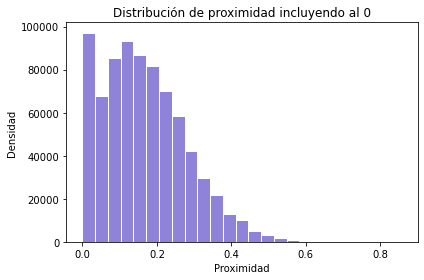

In [43]:
# tomando solo los elementos por debajo de la diagonal principal
# grafico la distribucion de proximidad con el 0
sns.histplot(X11.values[np.tril_indices(X11.shape[0],-1)], color="slateblue", bins=25, edgecolor='white')
plt.title("Distribución de proximidad incluyendo al 0")
plt.ylabel("Densidad")
plt.xlabel('Proximidad')
plt.tight_layout()
plt.show()

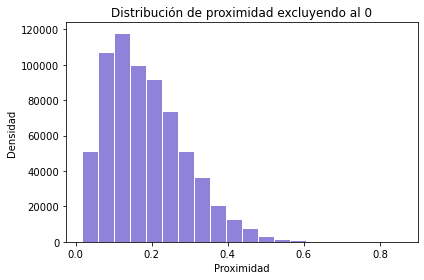

In [44]:
# tomando solo los elementos por debajo de la diagonal principal
# grafico la distribucion de proximidad sin el 0
sns.histplot(X11[X11!=0].values[np.tril_indices(X11.shape[0],-1)], color="slateblue", bins=20, edgecolor='white')
plt.title("Distribución de proximidad excluyendo al 0")
plt.ylabel("Densidad")
plt.xlabel('Proximidad')
plt.tight_layout()
plt.show()

In [45]:
# creo funcion para plotear histogramas en escala log de los pesos y los guardo en carpeta -uno por periodo-
def plot_hist_weight_logscale(data, list_years, nro_df, save=False):
    for i in list_years:        
        sns.histplot(data[i][data[i] != 0.0].values[np.tril_indices(data[i].shape[0],-1)], color="slateblue", 
             bins=20, edgecolor='white', kde=True, log_scale=True)
        plt.title(f'Distribución de proximidad: {i}\n (en escala logarítimica)')
        plt.ylabel("Densidad")
        plt.xlabel('Proximidad')
        plt.tight_layout()
        if save:
            folder = os.path.abspath('.').replace('notebooks','figures')
            file_path = os.path.join(folder, f'hist_proximidad_logscale_{i}_df{nro_df}.png')
            plt.savefig(file_path)
            plt.close()
            print(f'{file_path} guardado exitosamente.')
        else:
            plt.show()

In [46]:
plot_hist_weight_logscale(dic_prox_matrix1, list_years1, 1, save=True)

C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\hist_proximidad_logscale_1719_df1.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\hist_proximidad_logscale_0709_df1.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\hist_proximidad_logscale_9799_df1.png guardado exitosamente.


In [47]:
plot_hist_weight_logscale(dic_prox_matrix2, list_years2, 2, save=True)

C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\hist_proximidad_logscale_1719_df2.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\hist_proximidad_logscale_0709_df2.png guardado exitosamente.


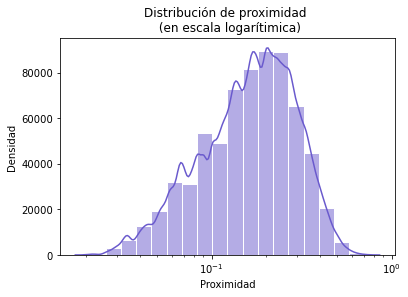

<Figure size 432x288 with 0 Axes>

In [48]:
# tomando solo los elementos por debajo de la diagonal principal
# grafico la distribucion de proximimidad sin el 0 en escala log
sns.histplot(X11[X11 != 0.0].values[np.tril_indices(X11.shape[0],-1)], color="slateblue", 
             bins=20, edgecolor='white', kde=True, log_scale=True)
plt.title("Distribución de proximidad \n (en escala logarítimica)")
plt.ylabel("Densidad")
plt.xlabel('Proximidad')
plt.show()
plt.tight_layout() 

In [49]:
# creo funcion para plotear histogramas de los pesos y los guardo en carpeta -uno por periodo-
def displot_logscale(data, list_years, nro_df, save=False):
    for i in list_years:        
        sns.displot(data[i][data[i] != 0.0].values[np.tril_indices(data[i].shape[0],-1)], kind='kde', color="slateblue")
        plt.xscale('log')
        plt.title(f'Distribución de proximidad: {i}\n (en escala logarítimica)')
        plt.ylabel("Densidad")
        plt.xlabel('Proximidad')
        plt.tight_layout()
        if save:
            folder = os.path.abspath('.').replace('notebooks','figures')
            file_path = os.path.join(folder, f'displot_logscale_{i}_df{nro_df}.png')
            plt.savefig(file_path)
            plt.close()
            print(f'{file_path} guardado exitosamente.')
        else:
            plt.show()

In [50]:
displot_logscale(dic_prox_matrix1, list_years1, 1, save=True)

C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\displot_logscale_1719_df1.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\displot_logscale_0709_df1.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\displot_logscale_9799_df1.png guardado exitosamente.


In [51]:
displot_logscale(dic_prox_matrix2, list_years2, 2, save=True)

C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\displot_logscale_1719_df2.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\displot_logscale_0709_df2.png guardado exitosamente.


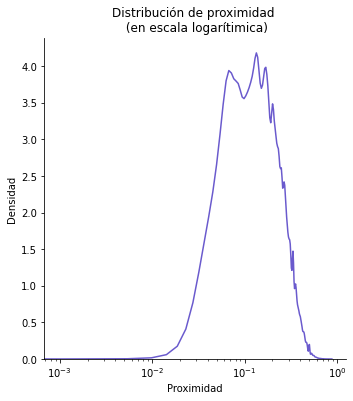

<Figure size 432x288 with 0 Axes>

In [52]:
# grafico la distribucion de pesos sin el 0 en escala log
sns.displot(X11[X11 != 0.0].values[np.tril_indices(X11.shape[0],-1)], kind='kde', color="slateblue")
plt.xscale('log')
plt.title("Distribución de proximidad \n (en escala logarítimica)")
plt.ylabel("Densidad")
plt.xlabel('Proximidad')
plt.show()
plt.tight_layout()# creo funcion para plotear histogramas de los pesos y los guardo en carpeta -uno por periodo-

In [53]:
# creo funcion para plotear histogramas de los pesos y los guardo en carpeta -uno por periodo-
def displot_logscale_acum(data, list_years, nro_df, save=False):
    for i in list_years:        
        sns.displot(data[i][data[i] != 0.0].values[np.tril_indices(data[i].shape[0],-1)], kind='kde', color="slateblue", cumulative=True)
        plt.xscale('log')
        plt.title(f'Distribución acumulada de pesos: {i}\n (en escala logarítimica)')
        plt.ylabel("Densidad")
        plt.xlabel('Pesos')
        plt.tight_layout()
        if save:
            folder = os.path.abspath('.').replace('notebooks','figures')
            file_path = os.path.join(folder, f'displot_acum_logscale_{i}_df{nro_df}.png')
            plt.savefig(file_path)
            plt.close()
            print(f'{file_path} guardado exitosamente.')
        else:
            plt.show()

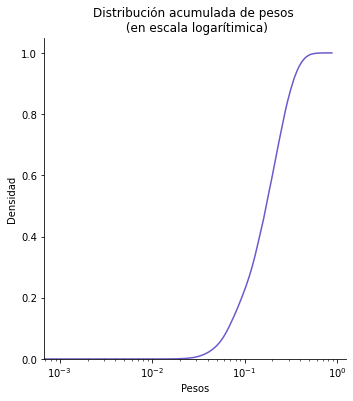

<Figure size 432x288 with 0 Axes>

In [54]:
# grafico la distribucion acumulada de pesos sin el 0 en escala log
sns.displot(X11[X11 != 0.0].values[np.tril_indices(X11.shape[0],-1)], kind='kde', color="slateblue", cumulative=True)
plt.xscale('log')
plt.title("Distribución acumulada de pesos \n (en escala logarítimica)")
plt.ylabel("Densidad")
plt.xlabel('Pesos')
plt.show()
plt.tight_layout() 

In [55]:
displot_logscale_acum(dic_prox_matrix1, list_years1, 1, save=True)

C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\displot_acum_logscale_1719_df1.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\displot_acum_logscale_0709_df1.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\displot_acum_logscale_9799_df1.png guardado exitosamente.


In [56]:
displot_logscale_acum(dic_prox_matrix2, list_years2, 2, save=True)

C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\displot_acum_logscale_1719_df2.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\prod-space\figures\displot_acum_logscale_0709_df2.png guardado exitosamente.


### Productos que se encuentran en la zona más (o menos) densa del bosque

*Hausmann & Klinger 2006*

También podemos ver qué bienes están en una parte densa del bosque y cuáles están en la periferia simplemente agregando la fila para ese producto en la matriz de proximidades. Definimos el número de productos ponderados por la distancia alrededor de un árbol i en el tiempo t (Hausmann & Klinger 2006).

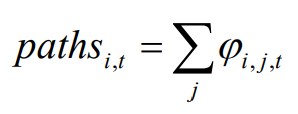

Veamos los productos que se encuentran en la parte más densa y más escasa del bosque para las exportaciones promedio 1719. 

Para tener una idea de los datos, podemos enumerar para cada bien qué otros productos están cerca y cuáles tienden a estar más lejos. Tomo como ejemplo el maíz, código HS 1005.

In [57]:
X11[X11.index==1005]

product_j,101,102,103,104,105,106,201,202,203,204,...,9615,9616,9617,9618,9701,9702,9703,9704,9705,9706
product_i,,,,,,,,,,,,,,,,,,,,,
1005,0.176471,0.222222,0.111111,0.285714,0.266667,0.171429,0.272727,0.25,0.1875,0.125,...,0.0625,0.0625,0.0,0.0625,0.125,0.0625,0.1875,0.0,0.25,0.125


In [58]:
X11[1005].sort_values(ascending=False).head(10) 
# vemos que tiene valores de proximidad altos con otros cultivos como la soja, aceite y pellets de soja, cebada, entre otros

product_i
1005    1.000000
1206    0.529412
1001    0.500000
1507    0.444444
2304    0.437500
2303    0.437500
3301    0.428571
1202    0.421053
1512    0.416667
1003    0.411765
Name: 1005, dtype: float64

In [65]:
# veo densidad para todos los productos y ordeno por mayor densidad
s = X11.sum()
s.sort_values(ascending=False)

product_j
4008    329.501635
3922    318.903116
7616    316.745313
4823    311.754366
8712    307.138213
           ...    
9502      0.000000
9501      0.000000
5304      0.000000
7012      0.000000
7414      0.000000
Length: 1241, dtype: float64

In [164]:
# pruebo de calcular lo mismo en el df merged así incluyo una columna con este dato y puedo ver las descripciones de productos
merged_df1.drop(['HS_code', 'es_bio_prod'],axis=1).select_dtypes(include='number').sum(axis=1)

product_i
101     186.873676
102     225.533203
103     243.151722
104     193.912375
105     272.311305
           ...    
9702    108.799664
9703    176.287620
9704    155.167729
9705    204.556339
9706    169.103019
Length: 1241, dtype: float64

In [183]:
# agrego columna con paths (suma de proximidades por producto)
merged_df1['paths']= merged_df1.drop(['HS_code', 'es_bio_prod'],axis=1).select_dtypes(include='number').sum(axis=1)

In [184]:
print('De los 20 prod con mayor densidad, solo', merged_df1[['HS_code', 'HS_description', 'es_bio_prod', 'paths']].sort_values('paths', ascending=False).head(20).es_bio_prod.sum(), 'son de la bioeconomía')
merged_df1[['HS_code', 'HS_description', 'es_bio_prod', 'paths']].sort_values('paths', ascending=False).head(20)

De los 20 prod con mayor densidad, solo 5 son de la bioeconomía


,HS_code,HS_description,es_bio_prod,paths
product_i,,,,
4008,4008,"Plates, sheets, strip, rods and profile shapes...",False,329.501635
3922,3922,"Baths, shower-baths, wash-basins, bidets, lava...",False,318.903116
7616,7616,Other articles of aluminium.,False,316.745313
4823,4823,"Other paper, paperboard, cellulose wadding and...",True,311.754366
8712,8712,Bicycles and other cycles (including delivery ...,False,307.138213
7307,7307,"Tube or pipe fittings (for example, couplings,...",False,305.265204
8708,8708,Parts and accessories of the motor vehicles of...,False,305.109594
8433,8433,"Harvesting or threshing machinery, including s...",False,304.513930
7007,7007,"Safety glass, consisting of toughened (tempere...",False,304.471337


In [185]:
print('De los 20 prod con menor densidad,', merged_df1[['HS_code', 'HS_description', 'es_bio_prod', 'paths']].sort_values('paths')[merged_df1.paths != 0.0].head(20).es_bio_prod.sum(), 'son de la bioeconomía')
merged_df1[['HS_code', 'HS_description', 'es_bio_prod', 'paths']].sort_values('paths')[merged_df1.paths != 0.0].head(20)

De los 20 prod con menor densidad, 7 son de la bioeconomía


<ipython-input-185-0dd800114526>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  print('De los 20 prod con menor densidad,', merged_df1[['HS_code', 'HS_description', 'es_bio_prod', 'paths']].sort_values('paths')[merged_df1.paths != 0.0].head(20).es_bio_prod.sum(), 'son de la bioeconomía')
<ipython-input-185-0dd800114526>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  merged_df1[['HS_code', 'HS_description', 'es_bio_prod', 'paths']].sort_values('paths')[merged_df1.paths != 0.0].head(20)


,HS_code,HS_description,es_bio_prod,paths
product_i,,,,
8908,8908,Vessels and other floating structures for brea...,False,8.615287
2612,2612,Uranium or thorium ores and concentrates.,False,9.359869
5310,5310,Woven fabrics of jute or of other textile bast...,True,39.052131
903,903,Mate,True,42.837806
502,502,"Pigs', hogs' or boars' bristles and hair; badg...",True,46.326422
8469,8469,Typewriters other than printers of heading No....,False,48.701309
4007,4007,Vulcanised rubber thread and cord.,False,49.038735
2524,2524,Asbestos.,False,49.891962
2610,2610,Chromium ores and concentrates.,False,54.648182


De acuerdo a lo observado por Hausmann & Klinger (2006), la parte más densa del bosque tiende a estar dominada por productos manufacturados, mientras que los productos con menor densidad tienden a ser productos agrícolas sin procesar. En este caso, se observa una situación similar con bienes manufacturados entre los más densos y presencia de bienes agrícolas sin procesar entre los menos densos o más escasos (como mate, copra, cerdas o pelos de cerdo o jabalí, productos comestibles de origen animal, perlas, etc.).

In [80]:
print(len(s[s==0.0]), 'bienes no tienen valores positivos de proximidad con ningún producto') # productos que no tienen valores positivos de proximidad con ningún otro bien
s[s==0.0]

24 bienes no tienen valores positivos de proximidad con ningún producto


product_j
503     0.0
509     0.0
1402    0.0
1403    0.0
2527    0.0
2838    0.0
4204    0.0
4815    0.0
5304    0.0
6503    0.0
7012    0.0
7414    0.0
7416    0.0
7417    0.0
7803    0.0
7805    0.0
7906    0.0
8004    0.0
8005    0.0
8006    0.0
9203    0.0
9204    0.0
9501    0.0
9502    0.0
dtype: float64

In [138]:
s[s!=0.0].sort_values(ascending=True).head(20)

product_j
8908     8.615287
2612     9.359869
5310    39.052131
903     42.837806
502     46.326422
8469    48.701309
4007    49.038735
2524    49.891962
2610    54.648182
6908    55.810347
2602    57.550449
2702    59.822220
4503    62.570864
3104    63.482603
410     64.773262
7101    65.064964
9108    73.137725
2609    73.605654
1203    73.881864
6702    74.506405
dtype: float64

In [50]:
X11.unstack().value_counts()

0.000000    181732
0.200000     50906
0.166667     48152
0.250000     43584
0.142857     38680
             ...  
0.719298         2
0.766667         2
0.620000         2
0.818182         2
0.781250         2
Length: 448, dtype: int64

In [51]:
X11.unstack().sort_values()

product_j  product_i
5604       4815         0.0
2702       3907         0.0
           3908         0.0
           3909         0.0
           3910         0.0
                       ... 
7212       7212         1.0
7213       7213         1.0
7214       7214         1.0
7216       7216         1.0
9706       9706         1.0
Length: 1540081, dtype: float64

In [89]:
# hago algunas pruebas
# X11.loc[((X11 < 0.1).astype(int).sum(axis=1) > 1000)]

In [90]:
# X11.loc[((X11 < X11.mean().mean()).astype(int).sum(axis=1) > 1000)]

In [91]:
# dic_prox_matrix1['1719'].loc[((dic_prox_matrix1['1719'] == 0).astype(int).sum(axis=1) > 1000)]

In [127]:
merged_df1[merged_df1.paths==0.0] # habría que descartar productos con paths=0

,101,102,103,104,105,106,201,202,203,204,...,9701,9702,9703,9704,9705,9706,HS_code,HS_description,es_bio_prod,paths
product_i,,,,,,,,,,,,,,,,,,,,,
503,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,503,"Horsehair and horsehair waste, whether or not ...",True,0.0
509,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,509,Natural sponges of animal origin.,True,0.0
1402,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1402,Vegetable materials of a kind used primarily a...,True,0.0
1403,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1403,Vegetable materials of a kind used primarily i...,True,0.0
2527,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2527,Natural cryolite; natural chiolite.,False,0.0
2838,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2838,"Fulminates, cyanates and thiocyanates",True,0.0
4204,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,4204,"Articles of leather or of composition leather,...",True,0.0
4815,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,4815,Floor coverings on a base of paper or of paper...,True,0.0
5304,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,5304,Sisal and other textile fibres of the genus Ag...,True,0.0


In [132]:
merged_df1[merged_df1.paths<20.0] # pruebo otros bienes con paths muy bajos => solo dos productos más que con el filtro anterior

,101,102,103,104,105,106,201,202,203,204,...,9701,9702,9703,9704,9705,9706,HS_code,HS_description,es_bio_prod,paths
product_i,,,,,,,,,,,,,,,,,,,,,
503,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,503,"Horsehair and horsehair waste, whether or not ...",True,0.000000
509,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,509,Natural sponges of animal origin.,True,0.000000
1402,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,1402,Vegetable materials of a kind used primarily a...,True,0.000000
1403,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,1403,Vegetable materials of a kind used primarily i...,True,0.000000
2527,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,2527,Natural cryolite; natural chiolite.,False,0.000000
2612,0.0,0.027778,0.0,0.047619,0.0,0.057143,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,2612,Uranium or thorium ores and concentrates.,False,9.359869
2838,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,2838,"Fulminates, cyanates and thiocyanates",True,0.000000
4204,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,4204,"Articles of leather or of composition leather,...",True,0.000000
4815,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,4815,Floor coverings on a base of paper or of paper...,True,0.000000


In [134]:
cols_to_drop = merged_df1[merged_df1.paths==0.0].HS_code
print(len(cols_to_drop), 'bienes a descartar')
cols_to_drop

24 bienes a descartar


product_i
503      503
509      509
1402    1402
1403    1403
2527    2527
2838    2838
4204    4204
4815    4815
5304    5304
6503    6503
7012    7012
7414    7414
7416    7416
7417    7417
7803    7803
7805    7805
7906    7906
8004    8004
8005    8005
8006    8006
9203    9203
9204    9204
9501    9501
9502    9502
Name: HS_code, dtype: int64

Se descartan los bienes que tienen pahts == 0. Habría que ver qué pasa con las demás matrices (períodos y dfs) si los productos que se descartan son los mismos para unificar luego el análisis en la comparación de bienes. 

In [135]:
merged_df1.drop(cols_to_drop, axis=1).drop(cols_to_drop, axis=0) # quedarían 1217 bienes en esta base

,101,102,103,104,105,106,201,202,203,204,...,9701,9702,9703,9704,9705,9706,HS_code,HS_description,es_bio_prod,paths
product_i,,,,,,,,,,,,,,,,,,,,,
101,1.000000,0.250000,0.277778,0.142857,0.266667,0.228571,0.454545,0.352941,0.294118,0.352941,...,0.294118,0.294118,0.235294,0.470588,0.352941,0.235294,101,"Live horses, asses, mules and hinnies.",True,186.873676
102,0.250000,1.000000,0.416667,0.361111,0.444444,0.388889,0.444444,0.194444,0.222222,0.250000,...,0.055556,0.027778,0.083333,0.166667,0.111111,0.083333,102,Live bovine animals.,True,225.533203
103,0.277778,0.416667,1.000000,0.190476,0.300000,0.285714,0.409091,0.055556,0.388889,0.166667,...,0.000000,0.055556,0.000000,0.222222,0.055556,0.055556,103,Live swine.,True,243.151722
104,0.142857,0.361111,0.190476,1.000000,0.433333,0.285714,0.181818,0.095238,0.095238,0.238095,...,0.047619,0.000000,0.095238,0.047619,0.142857,0.142857,104,Live sheep and goats.,True,193.912375
105,0.266667,0.444444,0.300000,0.433333,1.000000,0.485714,0.366667,0.166667,0.333333,0.166667,...,0.100000,0.066667,0.166667,0.133333,0.300000,0.166667,105,"Live poultry, that is to say, fowls of the spe...",True,272.311305
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9702,0.294118,0.027778,0.055556,0.000000,0.066667,0.057143,0.045455,0.066667,0.076923,0.066667,...,0.500000,1.000000,0.384615,0.285714,0.333333,0.363636,9702,"Original engravings, prints and lithographs.",False,108.799664
9703,0.235294,0.083333,0.000000,0.095238,0.166667,0.142857,0.136364,0.200000,0.153846,0.066667,...,0.461538,0.384615,1.000000,0.214286,0.384615,0.538462,9703,"Original sculptures and statuary, in any mater...",False,176.287620
9704,0.470588,0.166667,0.222222,0.047619,0.133333,0.085714,0.227273,0.200000,0.214286,0.333333,...,0.142857,0.285714,0.214286,1.000000,0.357143,0.142857,9704,"Postage or revenue stamps, stamp-postmarks, fi...",False,155.167729


In [140]:
(X11 == 0.0).astype(int).sum(axis=1).sort_values().head(20) # veo para cada prod con cuántos bienes tienen proximidad = 0 

product_i
3923    28
4821    29
7404    29
2712    30
7210    30
2828    30
7310    31
1905    32
2308    33
2008    33
4819    33
7308    34
3305    34
3401    35
2402    35
7217    35
7612    36
6809    36
301     36
8431    36
dtype: int64

In [86]:
# escalo la creación de datasets con matrices de proximidad por periodos y nro de df (1 o 2)
# creo funcion para generar datasets de las proximidades por período con sus descripciones 
def crear_datasets_con_descripciones(dic, list_years, nro_df):
    for i in list_years:
        merged_df = pd.merge(dic[i], clasif, how='left', left_on=['product_i'], right_on=['HS_code']) # uno matriz con descripciones de productos
        merged_df['es_bio_prod'] = np.where(merged_df['HS_code'].isin(list_bioecon.lista_prodbio), True, False) # agrego columna de si es o no prod_bio
        merged_df['paths']= merged_df.drop(['HS_code', 'es_bio_prod'],axis=1).select_dtypes(include='number').sum(axis=1) # agrego columna de paths
        cols_to_drop = merged_df[merged_df.paths==0.0].HS_code # armo lista de cols a descartar
        merged_df = merged_df.drop(cols_to_drop, axis=1).drop(cols_to_drop, axis=0) # descarto columnas
        merged_df.to_csv(f'../data/processed/prox_matix_desc_{i}_df{nro_df}.csv', index=False)

In [87]:
crear_datasets_con_descripciones(dic_prox_matrix1, list_years1, 1)

In [88]:
crear_datasets_con_descripciones(dic_prox_matrix2, list_years2, 2)

### Visualización de matrices de proximidad

In [74]:
# creo funcion para plotear heatmaps todos juntos y los guardo en carpeta -uno por periodo-
def plot_heatmap_proximity_matrix(data, list_years, nro_df, save=False):
    for i in list_years:        
        fig, ax = plt.subplots(figsize=(9,7))
        sns.heatmap(ax=ax, data=data[i], cmap='magma')
        plt.title(f'Matriz de Proximidad: {i}')
        if save:
            folder = os.path.abspath('.').replace('notebooks','figures')
            file_path = os.path.join(folder, f'heatmap_proximity_matrix_{i}_df{nro_df}.png')
            plt.savefig(file_path)
            plt.close()
            print(f'{file_path} guardado exitosamente.')
        else:
            plt.show()

In [76]:
plot_heatmap_proximity_matrix(dic_prox_matrix1, list_years1, 1, save=True)

C:\Users\sofi_\OneDrive\Documentos\Git\product-space\figures\heatmap_proximity_matrix_1719_df1.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\product-space\figures\heatmap_proximity_matrix_0709_df1.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\product-space\figures\heatmap_proximity_matrix_9799_df1.png guardado exitosamente.


In [77]:
plot_heatmap_proximity_matrix(dic_prox_matrix2, list_years2, 2, save=True)

C:\Users\sofi_\OneDrive\Documentos\Git\product-space\figures\heatmap_proximity_matrix_1719_df2.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\product-space\figures\heatmap_proximity_matrix_0709_df2.png guardado exitosamente.


In [78]:
# creo funcion para plotear clustermaps todos juntos y los guardo en carpeta -uno por periodo-
def plot_clustermap_proximity_matrix(data, list_years, nro_df, save=False):
    for i in list_years:        
        sns.clustermap(data[i].replace(np.nan, 0), method='average', cmap='magma', figsize=(8,8))
        plt.title(f'Matriz de Proximidad: {i} \n Ordenada según clusering jerárquico')
        if save:
            folder = os.path.abspath('.').replace('notebooks','figures')
            file_path = os.path.join(folder, f'clustermap_proximity_matrix_{i}_df{nro_df}.png')
            plt.savefig(file_path)
            plt.close()
            print(f'{file_path} guardado exitosamente.')
        else:
            plt.show()

In [79]:
plot_clustermap_proximity_matrix(dic_prox_matrix1, list_years1, 1, save=True)

C:\Users\sofi_\miniconda3\lib\site-packages\seaborn\matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


C:\Users\sofi_\OneDrive\Documentos\Git\product-space\figures\clustermap_proximity_matrix_1719_df1.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\product-space\figures\clustermap_proximity_matrix_0709_df1.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\product-space\figures\clustermap_proximity_matrix_9799_df1.png guardado exitosamente.


In [80]:
plot_clustermap_proximity_matrix(dic_prox_matrix2, list_years2, 2, save=True)

C:\Users\sofi_\OneDrive\Documentos\Git\product-space\figures\clustermap_proximity_matrix_1719_df2.png guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\product-space\figures\clustermap_proximity_matrix_0709_df2.png guardado exitosamente.


<AxesSubplot:xlabel='product_j', ylabel='product_i'>

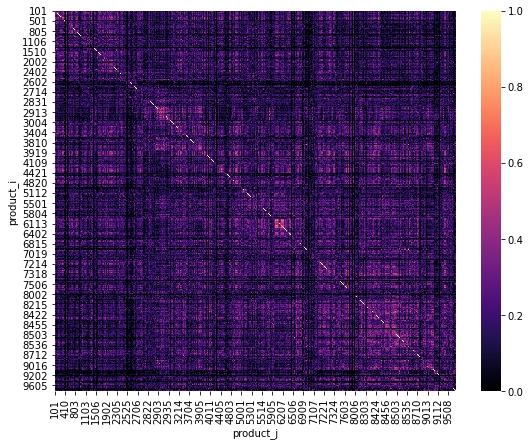

In [81]:
# Matriz de proximidad ordenada según nomenclatura del SA
fig, ax = plt.subplots(figsize=(9,7))
sns.heatmap(ax=ax, data=dic_prox_matrix1['1719'], cmap='magma')
# plt.title("Matriz de Proximidad ordenada por SA", size=14)

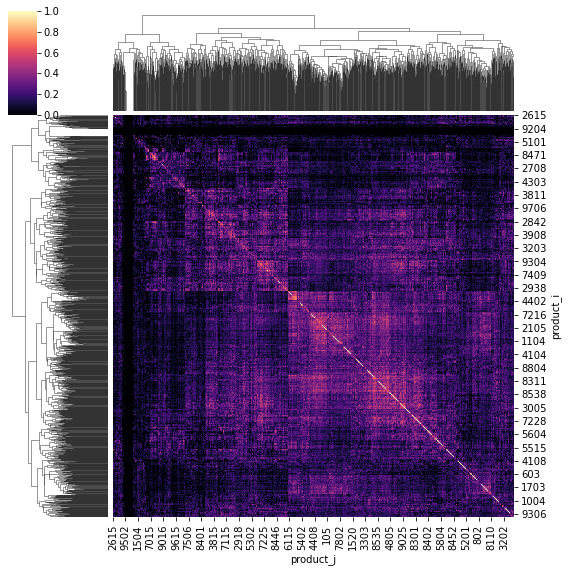

In [82]:
# Visualizo la matriz de proximidad ordenada usando un algoritmo de clustering jerárquico average linkage
cluster_map_1719 = sns.clustermap(X11, method='average', cmap='magma', figsize=(8,8))
cluster_map_1719
# plt.title("Matriz de Proximidad ordenada por Clusering jerárquico", size=14)

In [83]:
cluster_map_1719.dendrogram_row

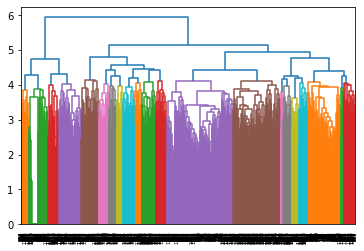

In [84]:
from scipy.cluster import hierarchy
Z = hierarchy.linkage(X11, 'average')
dn = hierarchy.dendrogram(Z)

In [85]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=21, linkage='average')
cluster.fit_predict(X11)

array([11,  4,  4, ..., 11, 11,  0], dtype=int64)

In [86]:
cluster.labels_

array([11,  4,  4, ..., 11, 11,  0], dtype=int64)

In [90]:
merged_df1['cluster_labels'] = cluster.labels_

In [91]:
merged_df1

,101,102,103,104,105,106,201,202,203,204,...,9618,9701,9702,9703,9704,9705,9706,HS_code,HS_description,cluster_labels
0,1.000000,0.250000,0.277778,0.142857,0.266667,0.228571,0.454545,0.352941,0.294118,0.352941,...,0.294118,0.294118,0.294118,0.235294,0.470588,0.352941,0.235294,101,"Live horses, asses, mules and hinnies.",11
1,0.250000,1.000000,0.416667,0.361111,0.444444,0.388889,0.444444,0.194444,0.222222,0.250000,...,0.166667,0.055556,0.027778,0.083333,0.166667,0.111111,0.083333,102,Live bovine animals.,4
2,0.277778,0.416667,1.000000,0.190476,0.300000,0.285714,0.409091,0.055556,0.388889,0.166667,...,0.222222,0.000000,0.055556,0.000000,0.222222,0.055556,0.055556,103,Live swine.,4
3,0.142857,0.361111,0.190476,1.000000,0.433333,0.285714,0.181818,0.095238,0.095238,0.238095,...,0.142857,0.047619,0.000000,0.095238,0.047619,0.142857,0.142857,104,Live sheep and goats.,2
4,0.266667,0.444444,0.300000,0.433333,1.000000,0.485714,0.366667,0.166667,0.333333,0.166667,...,0.266667,0.100000,0.066667,0.166667,0.133333,0.300000,0.166667,105,"Live poultry, that is to say, fowls of the spe...",4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1236,0.294118,0.027778,0.055556,0.000000,0.066667,0.057143,0.045455,0.066667,0.076923,0.066667,...,0.125000,0.500000,1.000000,0.384615,0.285714,0.333333,0.363636,9702,"Original engravings, prints and lithographs.",0
1237,0.235294,0.083333,0.000000,0.095238,0.166667,0.142857,0.136364,0.200000,0.153846,0.066667,...,0.187500,0.461538,0.384615,1.000000,0.214286,0.384615,0.538462,9703,"Original sculptures and statuary, in any mater...",0
1238,0.470588,0.166667,0.222222,0.047619,0.133333,0.085714,0.227273,0.200000,0.214286,0.333333,...,0.187500,0.142857,0.285714,0.214286,1.000000,0.357143,0.142857,9704,"Postage or revenue stamps, stamp-postmarks, fi...",11
1239,0.352941,0.111111,0.055556,0.142857,0.300000,0.171429,0.227273,0.133333,0.307692,0.133333,...,0.250000,0.416667,0.333333,0.384615,0.357143,1.000000,0.583333,9705,Collections and collectors' pieces of zoologic...,11


In [92]:
merged_df1.loc[merged_df1.cluster_labels==1][['HS_code','HS_description', 'cluster_labels']]

,HS_code,HS_description,cluster_labels
201,2502,Unroasted iron pyrites.,1
224,2525,"Mica, including splittings; mica waste.",1
225,2526,"Natural steatite, whether or not roughly trimm...",1
287,2821,Iron oxides and hydroxides; earth colours cont...,1
289,2823,Titanium oxides,1
320,2903,Halogenated derivatives of hydrocarbons,1
323,2906,"Cyclic alcohols and their halogenated, sulphon...",1
325,2908,"Halogenated, sulphonated, nitrated or nitrosat...",1
328,2911,"Acetals and hemiacetals, whether or not with o...",1
329,2912,"Aldehydes, whether or not with other oxygen fu...",1


In [93]:
def cluster_df(data, nro_df, save=False):
    for c in data.cluster_labels.unique():
        df = data.loc[data.cluster_labels==c][['HS_code','HS_description', 'cluster_labels']]
        if save:
            folder = os.path.abspath('.').replace('notebooks','data/processed/cluster groups')
            file_path = os.path.join(folder, f'cluster_df_{c}_df{nro_df}.csv')
            df.to_csv(file_path)
            print(f'{file_path} guardado exitosamente.')
        else:
            print(df)

In [94]:
cluster_df(merged_df1, 1, save=True)

C:\Users\sofi_\OneDrive\Documentos\Git\product-space\data/processed/cluster groups\cluster_df_11_df1.csv guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\product-space\data/processed/cluster groups\cluster_df_4_df1.csv guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\product-space\data/processed/cluster groups\cluster_df_2_df1.csv guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\product-space\data/processed/cluster groups\cluster_df_3_df1.csv guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\product-space\data/processed/cluster groups\cluster_df_19_df1.csv guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\product-space\data/processed/cluster groups\cluster_df_13_df1.csv guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\product-space\data/processed/cluster groups\cluster_df_14_df1.csv guardado exitosamente.
C:\Users\sofi_\OneDrive\Documentos\Git\product-space\data/processed/cluster groups\cluster_df_5_df1.csv gua

In [95]:
merged_df1[1206]

0       0.176471
1       0.277778
2       0.277778
3       0.428571
4       0.366667
          ...   
1236    0.058824
1237    0.117647
1238    0.000000
1239    0.176471
1240    0.176471
Name: 1206, Length: 1241, dtype: float64

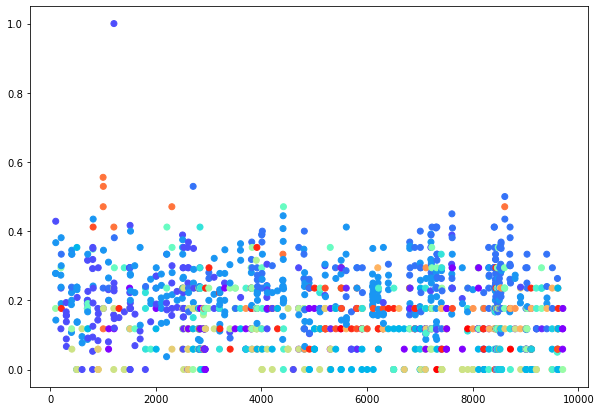

In [96]:
plt.figure(figsize=(10, 7))
plt.scatter(merged_df1['HS_code'], merged_df1[1206], c=cluster.labels_, cmap='rainbow')

C:\Users\sofi_\miniconda3\lib\site-packages\seaborn\matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


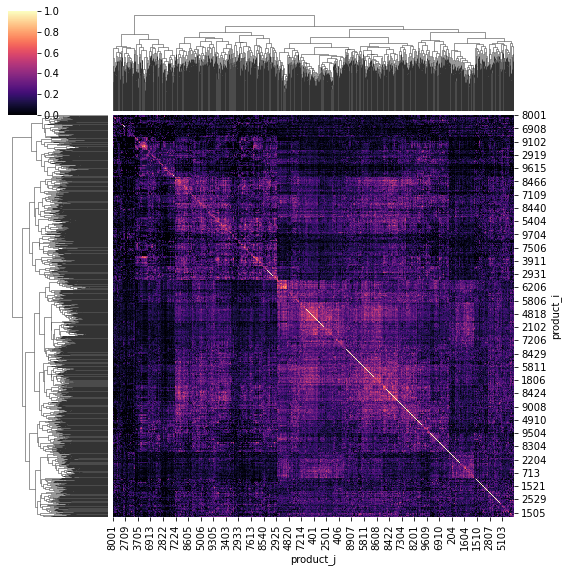

In [97]:
# Visualizo la matriz de proximidad ordenada usando un algoritmo de clustering jerárquico average linkage
cluster_map_1719_prueba = sns.clustermap(X11_prueba, method='average', cmap='magma', figsize=(8,8))
cluster_map_1719_prueba
# plt.title("Matriz de Proximidad ordenada por Clusering jerárquico", size=14)

<AxesSubplot:xlabel='product_j', ylabel='product_i'>

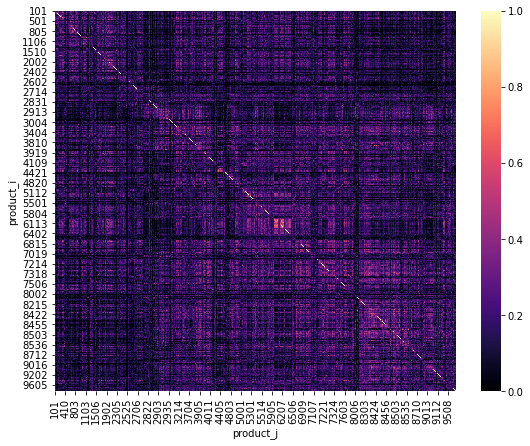

In [125]:
# Matriz de proximidad ordenada según nomenclatura del SA
fig, ax = plt.subplots(figsize=(9,7))
sns.hea# Matriz de proximidad ordenada según nomenclatura del SA
fig, ax = plt.subplots(figsize=(9,7))
sns.heatmap(ax=ax, data=dic_prox_matrix['0709'], cmap='magma')
# plt.title("Matriz de Proximidad ordenada por SA", size=14)

# Visualizo la matriz de proximidad ordenada usando un algoritmo de clustering jerárquico average linkage
sns.clustermap(X1, method='average', cmap='magma', figsize=(8,8))
# plt.title("Matriz de Proximidad ordenada por Clusering jerárquico", size=14)map(ax=ax, data=dic_prox_matrix['0709'], cmap='magma')
# plt.title("Matriz de Proximidad ordenada por SA", size=14)

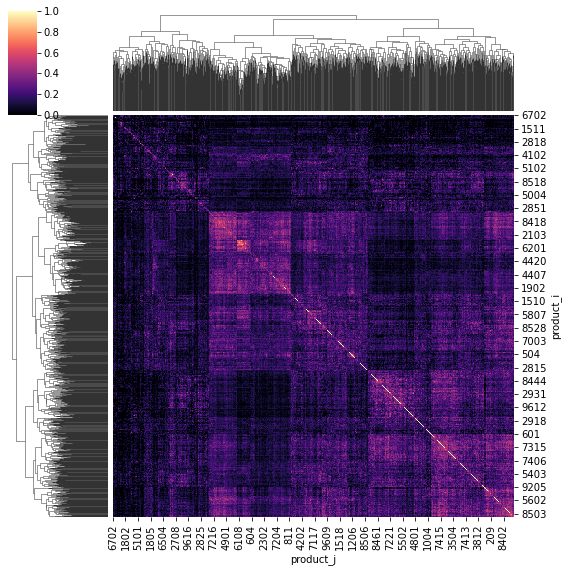

In [126]:
# Visualizo la matriz de proximidad ordenada usando un algoritmo de clustering jerárquico average linkage
sns.clustermap(X1, method='average', cmap='magma', figsize=(8,8))
# plt.title("Matriz de Proximidad ordenada por Clusering jerárquico", size=14)

<AxesSubplot:xlabel='product_j', ylabel='product_i'>

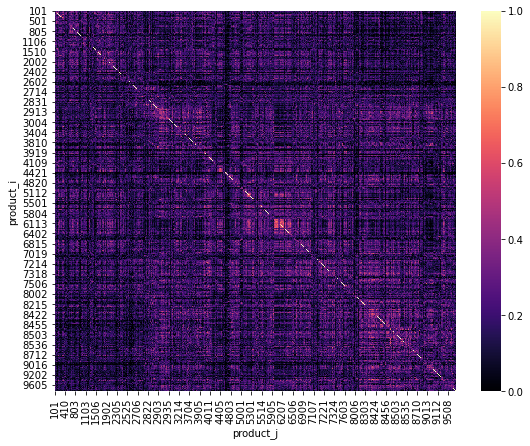

In [127]:
# Matriz de proximidad ordenada según nomenclatura del SA
fig, ax = plt.subplots(figsize=(9,7))
sns.heatmap(ax=ax, data=dic_prox_matrix['9799'], cmap='magma')
# plt.title("Matriz de Proximidad ordenada por SA", size=14)

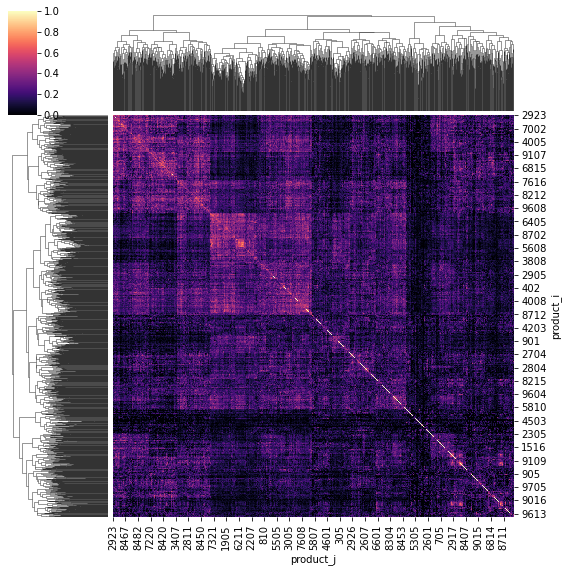

In [128]:
# Visualizo la matriz de proximidad ordenada usando un algoritmo de clustering jerárquico average linkage
sns.clustermap(X2, method='average', cmap='magma', figsize=(8,8))
# plt.title("Matriz de Proximidad ordenada por Clusering jerárquico", size=14)

Las Figuras (mapas de calor) previas muestran una versión de la matriz de proximidad ordenada según SA y otra según una agrupación jerárquica (clustering jerárquico) para cada promedio de años analizado. Un espacio de producto suave y un homogéneo implicaría valores uniformes (coloración homogénea) del mapa de calor, mientras que un modelo de escalera de producto sugeriría una matriz con valores altos (o coloración brillante) solo a lo largo de la diagonal. En cambio, el espacio de producto de las diferentes figuras parece ser modular, tal como ocurría en el documento original de Hidalgo et. al (2007), con algunos bienes altamente conectados (colores claros) y otros más bien desconectados (colores oscuros). 

Al igual que en Hidalgo et al (2007), el espacio de productos en conjunto es escaso, con $\phi_{ij}$ distribuido de acuerdo con una amplia distribución con un 9% de sus elementos igual a cero, 32% de ellos menor que 0,1 y 68% de las entradas con valores inferiores a 0,2. Este significativo número de conexiones insignificantes requieren una representación de red, lo que nos permite explorar la estructura del espacio de productos, junto con la proximidad entre productos de las clasificaciones dadas y participación en el comercio mundial. 

In [60]:
# creo un dataframe con los nodos de entrada, salida y pesos por cada periodo
edge_df_tot = pd.DataFrame()
for i in list_years:
    edge_list = dic_prox_matrix[i].unstack()
    edge_list = edge_list[edge_list != 1.0] # elimino los llamados a si mismo para obtener solo nodos i y j 
    edge_list = edge_list.reset_index()
    edge_list.columns = ["Pi","Pj","weight"]
    edge_list['years'] = np.repeat(str(i), len(edge_list))
    edge_df_tot = edge_df_tot.append(edge_list)    

In [64]:
edge_df_tot.years.unique()

array(['1719', '0709', '9799'], dtype=object)

In [68]:
edge_df_tot.loc[edge_df_tot.years=='1719'][["weight"]]

,weight
0,0.217391
1,0.263158
2,0.153846
3,0.257143
4,0.155556
...,...
1541339,0.111111
1541340,0.055556
1541341,0.055556
1541342,0.166667


In [47]:
edge_list_1719 = X.unstack()
edge_list_1719

product_j  product_i
101        101          1.000000
           102          0.217391
           103          0.263158
           104          0.153846
           105          0.257143
                          ...   
9999       9703         0.055556
           9704         0.055556
           9705         0.166667
           9706         0.111111
           9999         1.000000
Length: 1542564, dtype: float64

In [48]:
edge_list_1719 = edge_list_1719[edge_list_1719 != 1.0] # elimino los llamados a si mismo para obtener solo nodos i y j  
edge_list_1719 = edge_list_1719.reset_index()
edge_list_1719.columns = ["Pi","Pj","weight"]
edge_list_1719['year'] = np.repeat('1719', len(edge_list_1719)) 
edge_list_1719

,Pi,Pj,weight,year
0,101,102,0.217391,1719
1,101,103,0.263158,1719
2,101,104,0.153846,1719
3,101,105,0.257143,1719
4,101,106,0.155556,1719
...,...,...,...,...
1541339,9999,9702,0.111111,1719
1541340,9999,9703,0.055556,1719
1541341,9999,9704,0.055556,1719
1541342,9999,9705,0.166667,1719


In [49]:
edge_list_ = X1.unstack()
edge_list_ = edge_list_[edge_list_ != 1.0] # elimino los llamados a si mismo para obtener solo nodos i y j  
edge_list_ = edge_list_.reset_index()
edge_list_.columns = ["Pi","Pj","weight"]
edge_list_['year'] = np.repeat('0709', len(edge_list_)) 
edge_list_

,Pi,Pj,weight,year
0,101,102,0.289474,0709
1,101,103,0.157895,0709
2,101,104,0.275862,0709
3,101,105,0.193548,0709
4,101,106,0.185185,0709
...,...,...,...,...
1541317,9999,9702,0.142857,0709
1541318,9999,9703,0.142857,0709
1541319,9999,9704,0.285714,0709
1541320,9999,9705,0.142857,0709


In [52]:
df_list = pd.DataFrame()
df_list = df_list.append(edge_list_)
df_list.append(edge_list_1719)


,Pi,Pj,weight,year
0,101,102,0.289474,0709
1,101,103,0.157895,0709
2,101,104,0.275862,0709
3,101,105,0.193548,0709
4,101,106,0.185185,0709
...,...,...,...,...
1541339,9999,9702,0.111111,1719
1541340,9999,9703,0.055556,1719
1541341,9999,9704,0.055556,1719
1541342,9999,9705,0.166667,1719


**Veo la distribución de los pesos (matriz de proximidad)**

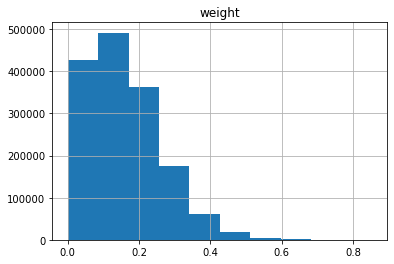

In [7]:
edge_list_1719[["weight"]].hist(); # como se distribuye nuestra medida de proximidad

In [69]:
# creo funcion para plotear heatmaps todos juntos y los guardo en carpeta -uno por periodo-
def plot_hist_proximity_matrix(data, save=False):
    for i in list_years:  
        data.loc[data.years==i][["weight"]].hist()
        plt.title(f'Histograma valores de proximidad: {i}')
        if save:
            folder = os.path.abspath('.').replace('notebooks','figures')
            file_path = os.path.join(folder, f'histograma_valores_poximidad_{i}.png')
            plt.savefig(file_path)
            plt.close()
            print(f'{file_path} guardado exitosamente.')
        else:
            plt.show()

In [70]:
 plot_hist_proximity_matrix(edge_df_tot,save=True)

C:\Users\sperini.NOTEBOOK44\Documents\Git\product-space\figures\histograma_valores_poximidad_1719.png guardado exitosamente.
C:\Users\sperini.NOTEBOOK44\Documents\Git\product-space\figures\histograma_valores_poximidad_0709.png guardado exitosamente.
C:\Users\sperini.NOTEBOOK44\Documents\Git\product-space\figures\histograma_valores_poximidad_9799.png guardado exitosamente.


In [8]:
# cantidad de valores = 0 
sum(i == 0.0 for i in edge_list_1719[["weight"]].unstack()) / sum(i < 1.0 for i in edge_list_1719[["weight"]].unstack())* 100 

9.426059335229514

In [9]:
# cantidad de valores menores a 0.1
sum(i < 0.1 for i in edge_list_1719[["weight"]].unstack()) / sum(i < 1.0 for i in edge_list_1719[["weight"]].unstack())* 100 

32.36318433782465

In [10]:
# cantidad de valores menores a 0.2
sum(i < 0.2 for i in edge_list_1719[["weight"]].unstack()) / sum(i < 1.0 for i in edge_list_1719[["weight"]].unstack())* 100 

68.0855149791351

In [12]:
max_links = (X.shape[0]*X.shape[0]-X.shape[0])//2 # número máximo de links
max_links

770661

**numpy.tril_indices(n, k=0, m=None)**

Devuelve los índices del triángulo inferior de una matriz (n, m). Por lo que, para los cálculos sólo tomamos los valores del triángulo inferior. 

[source](https://numpy.org/doc/stable/reference/generated/numpy.tril_indices.html)

In [173]:
sorted(X.values[np.tril_indices(X.shape[0],-1)]) # paso la matriz a una dimensión -solo la mitad de la matriz, sin repeticiones- y la ordeno 

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0

In [175]:
int(0.1*(X.shape[0]*X.shape[0]-X.shape[0])//2) # para calcular a distintas desidades, el numero de enlaces

77066

In [177]:
# para calcular los umbrales según la densidad de aristas definidas -ej. con densidad = 0.1-
sorted(X.values[np.tril_indices(X.shape[0],-1)])[int(0.1*(X.shape[0]*X.shape[0]-X.shape[0])//2)] 

0.025

In [20]:
# armo funcion para crear grafos a distintos niveles de densidad de aristas con lista
def grafos_pordensidad(proximity_matrix:pd.DataFrame, densities:list):
    # cantidad de filas de la matriz (es una matriz cuadrada, así que filas==columnas)
    n = proximity_matrix.shape[0]
    max_links = (n*n-n)//2 # máxima cantidad de links
    tril_idx = np.tril_indices(n,-1) # conserva la mitad de la matriz
    sorted_proximities = sorted(proximity_matrix.values[tril_idx].flatten(),reverse=True) # la pasa a una dimensión y la ordena
     
    Gs = []
    for d in densities:
        idx = int(d*max_links) # probamos con distinto número de links en base a la densidad definida
        threshold = sorted_proximities[idx] # calculamos el umbral correspondiente a dicha densidad
        Gs.append(nx.from_pandas_adjacency(proximity_matrix>=threshold)) # armamos grafos a distintos umbrales
        
    return Gs

In [58]:
# armo funcion para crear grafos a distintos niveles de densidad de aristas con diccionario
def grafos_pordensidad_dict(proximity_matrix:pd.DataFrame, densities:list):
    # cantidad de filas de la matriz (es una matriz cuadrada, así que filas==columnas)
    n = proximity_matrix.shape[0]
    max_links = (n*n-n)//2 # máxima cantidad de links
    tril_idx = np.tril_indices(n,-1) # conserva la mitad de la matriz
    sorted_proximities = sorted(proximity_matrix.values[tril_idx].flatten(),reverse=True) # la pasa a una dimensión y la ordena
     
    Gs = dict()
    for d in densities:
        idx = int(d*max_links) # probamos con distinto número de links en base a la densidad definida
        threshold = sorted_proximities[idx] # calculamos el umbral correspondiente a dicha densidad
        Gs[threshold] = nx.from_pandas_adjacency(proximity_matrix>=threshold) # armamos grafos a distintos umbrales
        
    return Gs

In [13]:
# creamos grafos a distintas densidades de aristas
densidades = np.arange(0,1,0.1)
densidades

array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

In [21]:
# creamos grafos a distintas densidades de aristas
grafos= grafos_pordensidad(X, densidades) 

In [22]:
grafos

In [17]:
# cambio densidades de aristas 
densities = np.arange(0,1,0.04)
densities

array([0.  , 0.04, 0.08, 0.12, 0.16, 0.2 , 0.24, 0.28, 0.32, 0.36, 0.4 ,
       0.44, 0.48, 0.52, 0.56, 0.6 , 0.64, 0.68, 0.72, 0.76, 0.8 , 0.84,
       0.88, 0.92, 0.96])

In [23]:
# creamos grafos a estas nuevas densidades de aristas
graphs = grafos_pordensidad(X, densities) 
graphs

In [24]:
for i, G in enumerate(graphs): # para cada i (número de orden) y G (los grafos generados anteriormente)
    G.name = "Grafo con d = " + str(round(densities[i],2)) # defino el nombre de cada grafo

In [25]:
graphs[0].name

'Grafo con d = 0.0'

In [26]:
range(len(graphs))

range(0, 25)

In [59]:
graphs_dict = grafos_pordensidad_dict(X, densities)
graphs_dict

{0.8536585365853658: <networkx.classes.graph.Graph at 0x1f7aac59730>,
 0.36: <networkx.classes.graph.Graph at 0x1f8bcff2640>,
 0.3142857142857143: <networkx.classes.graph.Graph at 0x1f8c23ecfa0>,
 0.2857142857142857: <networkx.classes.graph.Graph at 0x1f8c6115dc0>,
 0.2608695652173913: <networkx.classes.graph.Graph at 0x1f8c23ec1c0>,
 0.24: <networkx.classes.graph.Graph at 0x1f8c23eccd0>,
 0.2222222222222222: <networkx.classes.graph.Graph at 0x1f8c23ecee0>,
 0.20930232558139536: <networkx.classes.graph.Graph at 0x1f8c23ece80>,
 0.1956521739130435: <networkx.classes.graph.Graph at 0x1f8c23ec310>,
 0.18181818181818182: <networkx.classes.graph.Graph at 0x1f8c23ec400>,
 0.17142857142857143: <networkx.classes.graph.Graph at 0x1f8c23ec2b0>,
 0.15789473684210525: <networkx.classes.graph.Graph at 0x1f8c23ec3a0>,
 0.15: <networkx.classes.graph.Graph at 0x1f8c23ece50>,
 0.13793103448275862: <networkx.classes.graph.Graph at 0x1f8c23ecdf0>,
 0.125: <networkx.classes.graph.Graph at 0x1f8c23ecd90>,


In [93]:
graphs_dict.keys()

dict_keys([0.8536585365853658, 0.36, 0.3142857142857143, 0.2857142857142857, 0.2608695652173913, 0.24, 0.2222222222222222, 0.20930232558139536, 0.1956521739130435, 0.18181818181818182, 0.17142857142857143, 0.15789473684210525, 0.15, 0.13793103448275862, 0.125, 0.11764705882352941, 0.10714285714285714, 0.0967741935483871, 0.08571428571428572, 0.07407407407407407, 0.0625, 0.05, 0.038461538461538464, 0.0])

In [96]:
list_dict = list(graphs_dict.values())

In [92]:
len(list(graphs_dict.keys()))

24

In [77]:
graphs_dict[list(graphs_dict.keys())[0]]

In [27]:
import io
data_string = nx.info(graphs[0])
print(data_string)
info = io.StringIO(data_string)
print(info)
info_1 = pd.read_csv(info, sep="\n", header=None)
info_1.columns = ['row']

Name: Grafo con d = 0.0
Type: Graph
Number of nodes: 1242
Number of edges: 1221
Average degree:   1.9662


In [28]:
df_info1 = pd.DataFrame(info_1.row.str.split(':',1).tolist(),
                                 columns = ['flips','row']).T
df_info1.columns = df_info1[df_info1.index == 'flips'].values.tolist()
df_info1 = df_info1[df_info1.index == 'row']
df_info1 = df_info1.reset_index()
df_info1

,index,Name,Type,Number of nodes,Number of edges,Average degree
0,row,Grafo con d = 0.0,Graph,1242,1221,1.9662


In [29]:
data_string2 = nx.info(graphs[1])
info2 = io.StringIO(data_string2)
info_2 = pd.read_csv(info2, sep="\n", header=None)
info_2.columns = ['row']
df_info2 = pd.DataFrame(info_2.row.str.split(':',1).tolist(),
                                 columns = ['flips','row']).T
df_info2.columns = df_info2[df_info2.index == 'flips'].values.tolist()
df_info2 = df_info2[df_info2.index == 'row']
df_info2 = df_info2.reset_index()
df_info2

,index,Name,Type,Number of nodes,Number of edges,Average degree
0,row,Grafo con d = 0.04,Graph,1242,32793,52.8068


In [30]:
df_info1.append(df_info2)

,index,Name,Type,Number of nodes,Number of edges,Average degree
0,row,Grafo con d = 0.0,Graph,1242,1221,1.9662
0,row,Grafo con d = 0.04,Graph,1242,32793,52.8068


In [31]:
df_graphs = pd.DataFrame()
df_graphs = df_graphs.append(df_info1)
df_graphs = df_graphs.append(df_info2)
df_graphs

,index,Name,Type,Number of nodes,Number of edges,Average degree
0,row,Grafo con d = 0.0,Graph,1242,1221,1.9662
0,row,Grafo con d = 0.04,Graph,1242,32793,52.8068


In [79]:
# dataframes de info de grafos a distintas densidades de aristas
def info_grafos_pordensidad(graphs):
    df_graphs = pd.DataFrame()
    for i in range(len(graphs)):
        data_string = nx.info(graphs[i])
        info = io.StringIO(data_string)
        info_ = pd.read_csv(info, sep="\n", header=None)
        info_.columns = ['row '+ str(i)]
        df_info = pd.DataFrame(info_['row '+ str(i)].str.split(':',1).tolist(),
                                 columns = ['flips',('row '+ str(i))]).T
        df_info.columns = df_info[df_info.index == 'flips'].values.tolist()
        df_info = df_info[df_info.index == 'row '+ str(i)]
        df_graphs = df_graphs.append(df_info)
    return df_graphs

In [80]:
df_info_grafos = info_grafos_pordensidad(graphs)
df_info_grafos

,Name,Type,Number of nodes,Number of edges,Average degree
row 0,Grafo con d = 0.0,Graph,1242,1221,1.9662
row 1,Grafo con d = 0.04,Graph,1242,32793,52.8068
row 2,Grafo con d = 0.08,Graph,1242,63233,101.8245
row 3,Grafo con d = 0.12,Graph,1242,94530,152.2222
row 4,Grafo con d = 0.16,Graph,1242,125033,201.3414
row 5,Grafo con d = 0.2,Graph,1242,155624,250.6023
row 6,Grafo con d = 0.24,Graph,1242,194458,313.1369
row 7,Grafo con d = 0.28,Graph,1242,217076,349.5588
row 8,Grafo con d = 0.32,Graph,1242,248029,399.4026
row 9,Grafo con d = 0.36,Graph,1242,285282,459.3913


In [81]:
df_info_grafos['densidades'] = np.array(df_info_grafos[df_info_grafos.columns[0]].str.extract(r'(\d+.\d+)').astype('float'))
df_info_grafos

,Name,Type,Number of nodes,Number of edges,Average degree,densidades
row 0,Grafo con d = 0.0,Graph,1242,1221,1.9662,0.00
row 1,Grafo con d = 0.04,Graph,1242,32793,52.8068,0.04
row 2,Grafo con d = 0.08,Graph,1242,63233,101.8245,0.08
row 3,Grafo con d = 0.12,Graph,1242,94530,152.2222,0.12
row 4,Grafo con d = 0.16,Graph,1242,125033,201.3414,0.16
row 5,Grafo con d = 0.2,Graph,1242,155624,250.6023,0.20
row 6,Grafo con d = 0.24,Graph,1242,194458,313.1369,0.24
row 7,Grafo con d = 0.28,Graph,1242,217076,349.5588,0.28
row 8,Grafo con d = 0.32,Graph,1242,248029,399.4026,0.32
row 9,Grafo con d = 0.36,Graph,1242,285282,459.3913,0.36


In [82]:
df_info_grafos.columns

MultiIndex([(           'Name',),
            (           'Type',),
            ('Number of nodes',),
            ('Number of edges',),
            ( 'Average degree',),
            (     'densidades',)],
           )

In [83]:
df_info_grafos

,Name,Type,Number of nodes,Number of edges,Average degree,densidades
row 0,Grafo con d = 0.0,Graph,1242,1221,1.9662,0.00
row 1,Grafo con d = 0.04,Graph,1242,32793,52.8068,0.04
row 2,Grafo con d = 0.08,Graph,1242,63233,101.8245,0.08
row 3,Grafo con d = 0.12,Graph,1242,94530,152.2222,0.12
row 4,Grafo con d = 0.16,Graph,1242,125033,201.3414,0.16
row 5,Grafo con d = 0.2,Graph,1242,155624,250.6023,0.20
row 6,Grafo con d = 0.24,Graph,1242,194458,313.1369,0.24
row 7,Grafo con d = 0.28,Graph,1242,217076,349.5588,0.28
row 8,Grafo con d = 0.32,Graph,1242,248029,399.4026,0.32
row 9,Grafo con d = 0.36,Graph,1242,285282,459.3913,0.36


In [84]:
edges_distrib = df_info_grafos[['Number of edges','densidades']]

In [85]:
edges_distrib = edges_distrib.apply(pd.to_numeric, errors='ignore')

In [86]:
edges_distrib[['Number of edges']]

,Number of edges
row 0,1221
row 1,32793
row 2,63233
row 3,94530
row 4,125033
row 5,155624
row 6,194458
row 7,217076
row 8,248029
row 9,285282


In [87]:
edges_distrib[['cumsum_edges']] = edges_distrib[['Number of edges']].cumsum()

In [47]:
edges_distrib

,Number of edges,densidades,cumsum_edges
row 0,1221,0.00,1221
row 1,32793,0.04,34014
row 2,63233,0.08,97247
row 3,94530,0.12,191777
row 4,125033,0.16,316810
row 5,155624,0.20,472434
row 6,194458,0.24,666892
row 7,217076,0.28,883968
row 8,248029,0.32,1131997
row 9,285282,0.36,1417279


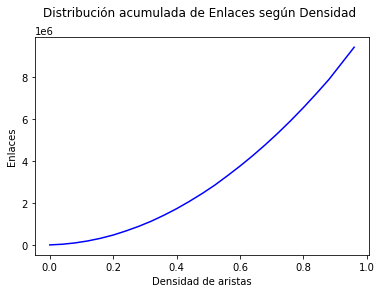

<Figure size 432x288 with 0 Axes>

In [145]:
# plot the cumulative function
plt.plot(edges_distrib[['densidades']].values, edges_distrib[['cumsum_edges']].values, c='blue')
plt.title("Distribución acumulada de Enlaces según Densidad \n")
plt.ylabel("Enlaces")
plt.xlabel('Densidad de aristas')
plt.show()
plt.tight_layout() 

In [124]:
edges_dict = info_grafos_pordensidad(list_dict)
edges_distrib_dict = edges_dict[['Number of edges']]

In [125]:
edges_distrib_dict = edges_distrib_dict.apply(pd.to_numeric, errors='ignore')
edges_distrib_dict[['cumsum_edges']] = edges_distrib_dict[['Number of edges']].cumsum()

In [126]:
edges_distrib_dict['umbrales'] = list(graphs_dict.keys())

In [122]:
type(list(graphs_dict.keys())[0])

numpy.float64

In [129]:
edges_distrib_dict

,Number of edges,cumsum_edges,umbrales
row 0,1221,1221,0.853659
row 1,32793,34014,0.360000
row 2,63233,97247,0.314286
row 3,94530,191777,0.285714
row 4,125033,316810,0.260870
row 5,155624,472434,0.240000
row 6,194458,666892,0.222222
row 7,217076,883968,0.209302
row 8,248029,1131997,0.195652
row 9,285282,1417279,0.181818


In [133]:
edges_distrib_dict[['umbrales']].values

array([[0.85365854],
       [0.36      ],
       [0.31428571],
       [0.28571429],
       [0.26086957],
       [0.24      ],
       [0.22222222],
       [0.20930233],
       [0.19565217],
       [0.18181818],
       [0.17142857],
       [0.15789474],
       [0.15      ],
       [0.13793103],
       [0.125     ],
       [0.11764706],
       [0.10714286],
       [0.09677419],
       [0.08571429],
       [0.07407407],
       [0.0625    ],
       [0.05      ],
       [0.03846154],
       [0.        ]])

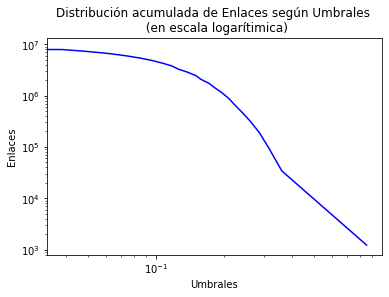

<Figure size 432x288 with 0 Axes>

In [143]:
# grafico distribucion acumulada en escala log 
plt.plot(edges_distrib_dict[['umbrales']].values,edges_distrib_dict[['cumsum_edges']].values, c='blue')
plt.yscale('log')
plt.xscale('log')
plt.title("Distribución acumulada de Enlaces según Umbrales \n (en escala logarítimica)")
plt.ylabel("Enlaces")
plt.xlabel('Umbrales')
plt.show()
plt.tight_layout() 

In [120]:
# heatmaps de matrices no ponderadas de grafos a distintas densidades de aristas
def heatmaps_pordensidad(grafos, densidades:list, save:bool=False):
    plt.figure(figsize=(20,20)) # tamaño del gráfico
    for i, G in enumerate(grafos): # para cada i (número de orden) y G (los gráficos generados anteriormente)
        plt.subplot(4,5,i+1) # grilla de 2x5
        sns.heatmap(nx.to_numpy_array(G), cbar= False, cmap = "magma") # el heatmap de cada G
        plt.title('Edge Density: {:0.3}'.format(densidades[i])) # el título indicando la densidad
        G.name = "Grafo con d = " + str(round(densidades[i],2)) # "Name" dentro del cuadrito
        textstr = nx.info(G) # el texto dentro del cuadito
        plt.text(5, 110, textstr, fontsize=9, bbox=dict(facecolor="white", alpha=0.9)) # El cuadrito de texto
        plt.tight_layout() 
    if save:
        folder = os.path.abspath('.').replace('notebooks','figures')
        file_path = os.path.join(folder, f'heatmaps_pordensidad_{densidades}.png')
        plt.savefig(file_path)
        plt.close()
        print(f'{file_path} guardado exitosamente.')
    else:
        plt.show()

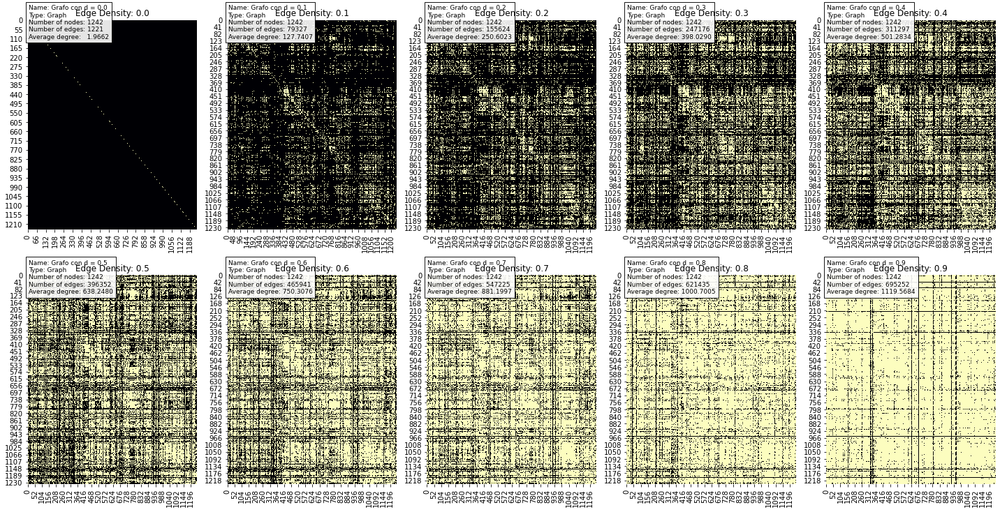

In [121]:
# graficamos los grafos para las distintas densidades de aristas
heatmaps_pordensidad(grafos, densidades)

In [122]:
# probamos con otras densidades cercanas a 0.5
densidades2 = np.arange(0.4,0.6,0.02)
grafos2 = grafos_pordensidad(X, densidades2)

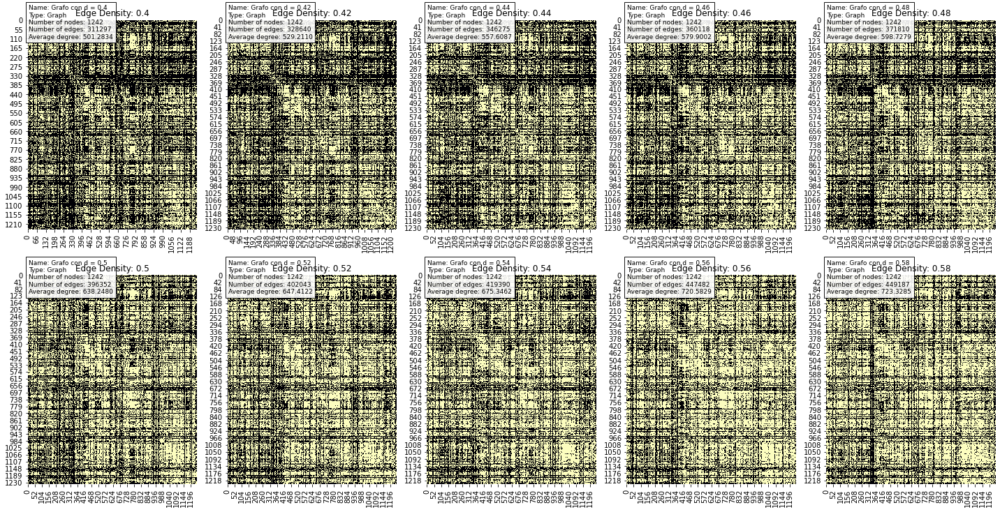

In [123]:
heatmaps_pordensidad(grafos2,densidades2)

### Visualización de los grafos

Los autores en el paper original generan una representación en red de la matriz de proximidad para ayudarlos a entender su estructura, así como visualizar y estudiar la dinámica de los países. La matriz que representa el espacio del producto tiene muchos valores pequeños que representan conexiones débiles entre productos. Es por eso que una representación de red se convierte en una forma adecuada de representar los productos, brindando una forma visual rápida de mostrar los enlaces y para determinar dónde se encuentran los países y hacia dónde podrían dirigirse.


**Árbol de expansión máximo (MST)**

Para incluir todos los productos en la red, lo que hacen es generar un "esqueleto": el árbol de expansión máximo (MST, por sus siglas en inglés). Esto no es más que el árbol que contiene una suma de pesos máxima. En otras palabras, es el conjunto de N-1 enlaces (siendo N el número de nodos) el que conecta todos los nodos de la red y maximiza la suma de las proximidades en ella.

In [105]:
G = nx.from_pandas_edgelist(edge_list_1719, source="Pi", target="Pj", edge_attr=["weight"])

In [106]:
print("# of Nodes: {}".format(G.number_of_nodes()))
print("# of Edges: {}".format(G.number_of_edges()))
print("Nodes degree: {}".format(G.degree()))

# of Nodes: 1242
# of Edges: 770683
Nodes degree: [(101, 1241), (102, 1241), (103, 1241), (104, 1241), (105, 1241), (106, 1241), (201, 1241), (202, 1241), (203, 1241), (204, 1241), (205, 1241), (206, 1241), (207, 1241), (208, 1241), (209, 1241), (210, 1241), (301, 1241), (302, 1241), (303, 1241), (304, 1241), (305, 1241), (306, 1241), (307, 1241), (401, 1241), (402, 1241), (403, 1241), (404, 1241), (405, 1241), (406, 1241), (407, 1241), (408, 1241), (409, 1241), (410, 1241), (501, 1241), (502, 1241), (503, 1243), (504, 1241), (505, 1241), (506, 1241), (507, 1241), (508, 1241), (509, 1243), (510, 1241), (511, 1241), (601, 1241), (602, 1241), (603, 1241), (604, 1241), (701, 1241), (702, 1241), (703, 1241), (704, 1241), (705, 1241), (706, 1241), (707, 1241), (708, 1241), (709, 1241), (710, 1241), (711, 1241), (712, 1241), (713, 1241), (714, 1241), (801, 1241), (802, 1241), (803, 1241), (804, 1241), (805, 1241), (806, 1241), (807, 1241), (808, 1241), (809, 1241), (810, 1241), (811, 1241), 

In [107]:
CG = nx.connected_components(G)

In [108]:
for n, nbrs in G.adj.items():
    for nbr, eattr in nbrs.items():
        wt = eattr['weight']
        if wt > 0.5: print(f"({n}, {nbr}, {wt:.3})")

(101, 405, 0.526)
(101, 3502, 0.632)
(101, 9021, 0.579)
(105, 407, 0.591)
(105, 1601, 0.525)
(105, 3402, 0.538)
(105, 4411, 0.514)
(105, 4817, 0.514)
(201, 202, 0.552)
(201, 206, 0.586)
(201, 1602, 0.514)
(202, 201, 0.552)
(202, 206, 0.56)
(202, 1502, 0.667)
(203, 209, 0.65)
(203, 210, 0.529)
(203, 1501, 0.526)
(203, 3504, 0.533)
(206, 201, 0.586)
(206, 202, 0.56)
(206, 504, 0.581)
(206, 510, 0.515)
(207, 408, 0.538)
(207, 1602, 0.514)
(209, 203, 0.65)
(209, 404, 0.565)
(209, 1501, 0.65)
(209, 5602, 0.542)
(209, 5911, 0.619)
(209, 8421, 0.524)
(209, 8433, 0.542)
(209, 8436, 0.55)
(209, 8701, 0.524)
(210, 203, 0.529)
(302, 303, 0.596)
(302, 304, 0.591)
(303, 302, 0.596)
(303, 304, 0.615)
(303, 307, 0.615)
(303, 2301, 0.538)
(304, 302, 0.591)
(304, 303, 0.615)
(304, 305, 0.568)
(304, 307, 0.551)
(304, 1604, 0.545)
(304, 2301, 0.568)
(305, 304, 0.568)
(305, 306, 0.512)
(305, 1604, 0.561)
(305, 2301, 0.512)
(306, 305, 0.512)
(306, 307, 0.612)
(306, 1605, 0.561)
(307, 303, 0.615)
(307, 304,

(2709, 2711, 0.552)
(2711, 2709, 0.552)
(2716, 403, 0.542)
(2716, 4415, 0.569)
(2716, 7214, 0.52)
(2803, 5902, 0.556)
(2808, 8702, 0.56)
(2810, 2528, 0.571)
(2812, 2848, 0.6)
(2812, 2919, 0.6)
(2812, 3705, 0.571)
(2812, 8444, 0.6)
(2815, 2901, 0.542)
(2817, 7408, 0.52)
(2823, 2920, 0.571)
(2828, 4818, 0.512)
(2831, 2911, 0.556)
(2833, 8110, 0.524)
(2841, 8106, 0.556)
(2842, 2920, 0.545)
(2842, 3701, 0.636)
(2842, 7002, 0.545)
(2848, 2812, 0.6)
(2850, 2920, 0.545)
(2850, 3705, 0.556)
(2850, 3707, 0.556)
(2850, 3910, 0.556)
(2851, 6908, 0.591)
(2901, 2815, 0.542)
(2901, 2905, 0.583)
(2901, 3901, 0.583)
(2902, 2907, 0.625)
(2902, 2910, 0.562)
(2902, 2914, 0.526)
(2902, 2916, 0.556)
(2902, 3907, 0.579)
(2903, 2908, 0.583)
(2903, 2909, 0.538)
(2903, 2912, 0.529)
(2903, 2915, 0.615)
(2903, 2920, 0.583)
(2903, 2931, 0.583)
(2905, 2901, 0.583)
(2906, 2907, 0.538)
(2906, 2925, 0.583)
(2907, 2902, 0.625)
(2907, 2906, 0.538)
(2907, 2909, 0.538)
(2907, 2910, 0.615)
(2907, 2914, 0.579)
(2907, 2915,

(3917, 7308, 0.523)
(3917, 7310, 0.523)
(3919, 8479, 0.556)
(3920, 403, 0.512)
(3920, 3208, 0.625)
(3920, 3305, 0.61)
(3920, 3402, 0.525)
(3920, 3917, 0.523)
(3920, 3921, 0.525)
(3920, 4818, 0.535)
(3920, 4822, 0.575)
(3920, 5505, 0.6)
(3920, 7308, 0.568)
(3920, 7604, 0.55)
(3920, 7902, 0.55)
(3921, 403, 0.558)
(3921, 1601, 0.6)
(3921, 3208, 0.525)
(3921, 3209, 0.514)
(3921, 3214, 0.571)
(3921, 3305, 0.512)
(3921, 3402, 0.564)
(3921, 3920, 0.525)
(3921, 3922, 0.543)
(3921, 3925, 0.538)
(3921, 4808, 0.543)
(3921, 4822, 0.571)
(3921, 4911, 0.543)
(3921, 6805, 0.543)
(3921, 7212, 0.543)
(3921, 7308, 0.568)
(3921, 7309, 0.548)
(3921, 7314, 0.514)
(3921, 7326, 0.595)
(3921, 8716, 0.514)
(3921, 9406, 0.514)
(3922, 3209, 0.515)
(3922, 3214, 0.515)
(3922, 3402, 0.564)
(3922, 3921, 0.543)
(3922, 3925, 0.538)
(3922, 4008, 0.533)
(3922, 4016, 0.533)
(3922, 4413, 0.514)
(3922, 4418, 0.538)
(3922, 4822, 0.529)
(3922, 4902, 0.567)
(3922, 6809, 0.515)
(3922, 6810, 0.562)
(3922, 7212, 0.516)
(3922, 73

(4817, 105, 0.514)
(4817, 4822, 0.529)
(4817, 7314, 0.514)
(4818, 403, 0.512)
(4818, 1601, 0.535)
(4818, 1704, 0.52)
(4818, 1904, 0.545)
(4818, 2105, 0.533)
(4818, 2828, 0.512)
(4818, 3208, 0.535)
(4818, 3305, 0.558)
(4818, 3402, 0.628)
(4818, 3920, 0.535)
(4818, 4415, 0.529)
(4818, 4819, 0.574)
(4818, 4822, 0.558)
(4818, 7308, 0.614)
(4818, 7314, 0.558)
(4818, 7604, 0.558)
(4818, 7610, 0.512)
(4818, 7612, 0.587)
(4818, 8544, 0.512)
(4819, 1101, 0.516)
(4819, 1601, 0.556)
(4819, 1704, 0.556)
(4819, 1904, 0.519)
(4819, 1905, 0.576)
(4819, 2005, 0.556)
(4819, 2103, 0.519)
(4819, 2105, 0.519)
(4819, 2106, 0.537)
(4819, 2202, 0.536)
(4819, 2309, 0.519)
(4819, 3305, 0.519)
(4819, 3402, 0.537)
(4819, 3917, 0.574)
(4819, 3923, 0.7)
(4819, 4415, 0.593)
(4819, 4818, 0.574)
(4819, 4820, 0.519)
(4819, 4821, 0.63)
(4819, 6106, 0.519)
(4819, 6109, 0.537)
(4819, 6203, 0.537)
(4819, 7306, 0.519)
(4819, 7308, 0.556)
(4819, 7309, 0.519)
(4819, 7310, 0.574)
(4819, 7404, 0.514)
(4819, 7604, 0.519)
(4820,

(6107, 6101, 0.641)
(6107, 6103, 0.692)
(6107, 6104, 0.694)
(6107, 6105, 0.65)
(6107, 6106, 0.542)
(6107, 6108, 0.641)
(6107, 6109, 0.66)
(6107, 6110, 0.667)
(6107, 6111, 0.556)
(6107, 6112, 0.528)
(6107, 6115, 0.556)
(6107, 6203, 0.633)
(6107, 6204, 0.634)
(6107, 6205, 0.581)
(6107, 6206, 0.575)
(6107, 6207, 0.667)
(6107, 6208, 0.658)
(6107, 6209, 0.556)
(6107, 6211, 0.65)
(6107, 6310, 0.512)
(6107, 6403, 0.556)
(6108, 6101, 0.615)
(6108, 6102, 0.6)
(6108, 6103, 0.667)
(6108, 6104, 0.692)
(6108, 6105, 0.675)
(6108, 6106, 0.646)
(6108, 6107, 0.641)
(6108, 6109, 0.638)
(6108, 6110, 0.718)
(6108, 6111, 0.564)
(6108, 6112, 0.564)
(6108, 6115, 0.59)
(6108, 6203, 0.571)
(6108, 6204, 0.585)
(6108, 6205, 0.605)
(6108, 6206, 0.55)
(6108, 6207, 0.641)
(6108, 6208, 0.641)
(6108, 6209, 0.513)
(6108, 6211, 0.6)
(6108, 6212, 0.615)
(6108, 6310, 0.558)
(6108, 6401, 0.59)
(6108, 6403, 0.667)
(6108, 6405, 0.533)
(6108, 6406, 0.59)
(6108, 8544, 0.564)
(6109, 709, 0.574)
(6109, 2005, 0.511)
(6109, 4819,

(6902, 8417, 0.529)
(6902, 8455, 0.529)
(6902, 8545, 0.556)
(6902, 8607, 0.545)
(6902, 8707, 0.526)
(6903, 3810, 0.562)
(6903, 7008, 0.55)
(6903, 7017, 0.533)
(6903, 8484, 0.533)
(6903, 8511, 0.55)
(6904, 6806, 0.52)
(6905, 4009, 0.542)
(6905, 4205, 0.538)
(6907, 5211, 0.529)
(6907, 5506, 0.529)
(6908, 2851, 0.591)
(6909, 2929, 0.538)
(6909, 3815, 0.571)
(6909, 3911, 0.538)
(6909, 5404, 0.556)
(6910, 7320, 0.545)
(6910, 7321, 0.591)
(6910, 9401, 0.517)
(6913, 9610, 0.533)
(7001, 4707, 0.521)
(7002, 2842, 0.545)
(7002, 7107, 0.556)
(7002, 7506, 0.556)
(7003, 9013, 0.571)
(7005, 7213, 0.548)
(7006, 3818, 0.75)
(7006, 7410, 0.75)
(7006, 8473, 0.667)
(7006, 8532, 0.615)
(7006, 8541, 0.636)
(7006, 8542, 0.538)
(7006, 8543, 0.556)
(7006, 9013, 0.625)
(7006, 9110, 0.625)
(7007, 4005, 0.545)
(7007, 4008, 0.609)
(7007, 5606, 0.545)
(7007, 5811, 0.545)
(7007, 7322, 0.609)
(7007, 7616, 0.593)
(7007, 8433, 0.542)
(7007, 8516, 0.538)
(7007, 8707, 0.591)
(7008, 5911, 0.524)
(7008, 6805, 0.565)
(7008

(8459, 8435, 0.55)
(8459, 8466, 0.55)
(8460, 3407, 0.533)
(8460, 8447, 0.545)
(8460, 8451, 0.538)
(8460, 8456, 0.538)
(8460, 8457, 0.545)
(8460, 8458, 0.615)
(8460, 8461, 0.636)
(8460, 8514, 0.583)
(8461, 8439, 0.556)
(8461, 8445, 0.556)
(8461, 8446, 0.6)
(8461, 8447, 0.667)
(8461, 8448, 0.533)
(8461, 8456, 0.538)
(8461, 8457, 0.545)
(8461, 8458, 0.615)
(8461, 8460, 0.636)
(8461, 8462, 0.533)
(8461, 8463, 0.667)
(8461, 8477, 0.538)
(8461, 8514, 0.583)
(8462, 4810, 0.533)
(8462, 7220, 0.533)
(8462, 7221, 0.533)
(8462, 7305, 0.533)
(8462, 8207, 0.556)
(8462, 8419, 0.529)
(8462, 8422, 0.533)
(8462, 8454, 0.533)
(8462, 8455, 0.533)
(8462, 8456, 0.6)
(8462, 8458, 0.6)
(8462, 8461, 0.533)
(8462, 8463, 0.6)
(8462, 8514, 0.533)
(8462, 8515, 0.647)
(8462, 9024, 0.533)
(8463, 8456, 0.538)
(8463, 8458, 0.538)
(8463, 8461, 0.667)
(8463, 8462, 0.6)
(8463, 8477, 0.615)
(8464, 6804, 0.579)
(8464, 8207, 0.667)
(8464, 8417, 0.529)
(8464, 8419, 0.529)
(8465, 8416, 0.571)
(8465, 8417, 0.588)
(8465, 8419,

(8701, 4006, 0.524)
(8701, 4008, 0.609)
(8701, 4811, 0.522)
(8701, 5911, 0.524)
(8701, 6805, 0.565)
(8701, 7008, 0.524)
(8701, 7322, 0.522)
(8701, 7609, 0.524)
(8701, 8408, 0.571)
(8701, 8412, 0.524)
(8701, 8421, 0.571)
(8701, 8433, 0.542)
(8701, 8436, 0.524)
(8701, 8530, 0.522)
(8701, 8704, 0.536)
(8701, 8707, 0.667)
(8702, 2808, 0.56)
(8702, 4011, 0.519)
(8702, 8704, 0.536)
(8703, 4005, 0.522)
(8703, 4008, 0.522)
(8703, 4009, 0.565)
(8703, 4010, 0.565)
(8703, 4016, 0.571)
(8703, 5911, 0.609)
(8703, 6805, 0.652)
(8703, 6806, 0.52)
(8703, 7211, 0.565)
(8703, 7320, 0.609)
(8703, 8407, 0.522)
(8703, 8409, 0.565)
(8703, 8412, 0.522)
(8703, 8414, 0.522)
(8703, 8512, 0.565)
(8703, 8530, 0.565)
(8703, 8708, 0.667)
(8704, 4012, 0.552)
(8704, 8701, 0.536)
(8704, 8702, 0.536)
(8707, 1501, 0.526)
(8707, 3820, 0.571)
(8707, 4005, 0.55)
(8707, 4008, 0.609)
(8707, 5906, 0.526)
(8707, 5911, 0.619)
(8707, 6807, 0.519)
(8707, 6902, 0.526)
(8707, 7007, 0.591)
(8707, 7226, 0.526)
(8707, 8408, 0.579)
(87

In [109]:
T = nx.maximum_spanning_tree(G, weight='weight')
T

In [114]:
min_T = nx.minimum_spanning_tree(G, weight='weight')
min_T

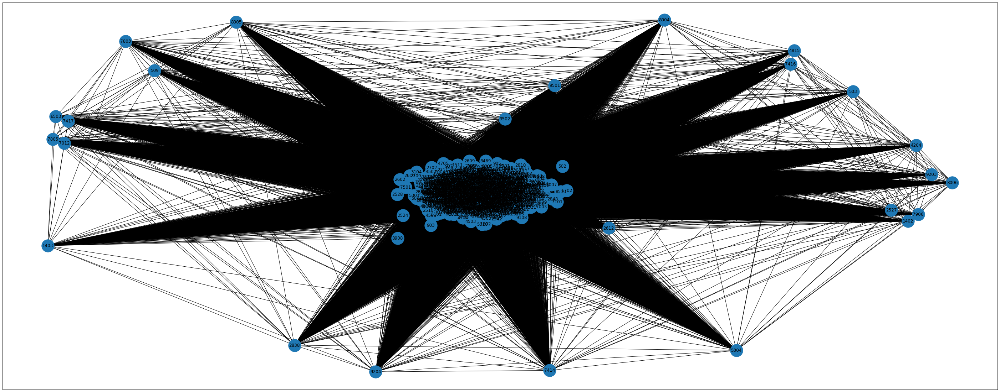

In [111]:
fig = plt.figure(figsize=(50,20))
ax = fig.gca()
nx.draw_networkx(G, ax=ax, pos=nx.spring_layout(G,k=0.2), node_size=1250, width=1)

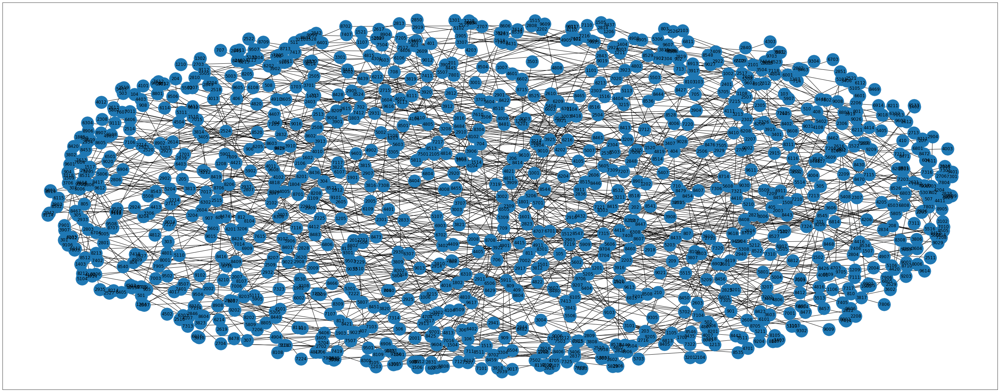

In [112]:
fig = plt.figure(figsize=(50,20))
ax = fig.gca()
nx.draw_networkx(T, ax=ax, pos=nx.spring_layout(T,k=0.2), node_size=1250, width=1)

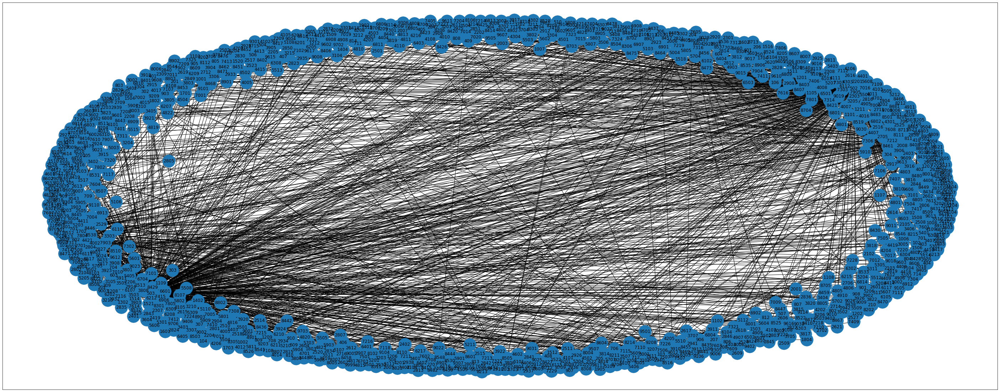

In [115]:
fig = plt.figure(figsize=(50,20))
ax = fig.gca()
nx.draw_networkx(min_T, ax=ax, pos=nx.spring_layout(min_T,k=0.2), node_size=1250, width=1)

In [125]:
print(nx.info(G))

Name: 
Type: Graph
Number of nodes: 1242
Number of edges: 770683
Average degree: 1241.0354


In [126]:
print(nx.info(T))
print(nx.info(min_T))

Name: 
Type: Graph
Number of nodes: 1242
Number of edges: 1241
Average degree:   1.9984
Name: 
Type: Graph
Number of nodes: 1242
Number of edges: 1241
Average degree:   1.9984


In [129]:
values = [v for v in nx.clustering(G).values()]
nx.draw(G,pos=nx.spring_layout(G,k=0.2), with_labels=True, node_color = values, font_color='white', edge_color='gray')

KeyboardInterrupt: 

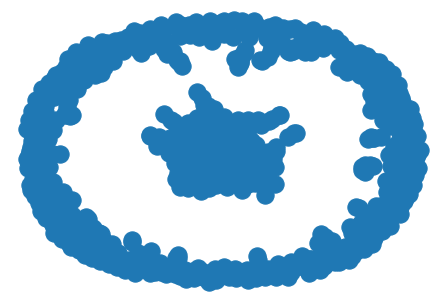

In [128]:
F = G.copy()
threshold = 0.5
F.remove_edges_from([(n1, n2) for n1, n2, w in F.edges(data="weight") if w < threshold])
nx.draw(F)
plt.show()

In [ ]:
# def slice_network(G, T, data = True):
#     """ Remove all edges with weight<T from G or its copy. """
#     F = G.copy() if copy else G
#     F.remove_edges_from([(n1, n2) for n1, n2, w in F.edges(data="weight") if w < T])
#     return F

Pendientes ==> Ver si amerita unificar cantidad de países en todos los años estudiados ya que no hay igual información disponible para cada período